# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

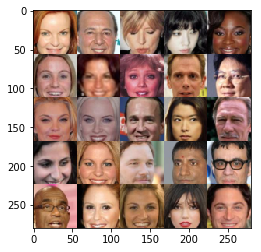

In [1]:
%matplotlib inline
import os
from glob import glob
import numpy as np
from matplotlib import pyplot
import helper
show_n_images = 25
data_dir = "./CS_IOC5008/HW2/data/"

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 56, 56, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [2]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or 

TensorFlow Version: 1.9.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [3]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], 'real_input_images')
    input_z = tf.placeholder(tf.float32, [None, z_dim], 'input_z')
    learning_rate = tf.placeholder(tf.float32, [], 'learning_rate')
    return real_input_images, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [4]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.5):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28xn
        # Convolutional layer, 14x14x64
        conv1 = tf.layers.conv2d(images, 64, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        lrelu1 = tf.maximum(alpha * conv1, conv1)
        drop1 = tf.layers.dropout(lrelu1, keep_prob)
        
        # Strided convolutional layer, 7x7x128
        conv2 = tf.layers.conv2d(drop1, 128, 5, 2, 'same', use_bias=False)
        bn2 = tf.layers.batch_normalization(conv2)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        drop2 = tf.layers.dropout(lrelu2, keep_prob)
        
        # Strided convolutional layer, 4x4x256
        conv3 = tf.layers.conv2d(drop2, 256, 5, 2, 'same', use_bias=False)
        bn3 = tf.layers.batch_normalization(conv3)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        drop3 = tf.layers.dropout(lrelu3, keep_prob)
        
        # fully connected
        flat = tf.reshape(drop3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [5]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=0.5):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=(not is_train)):
        # First fully connected layer, 4x4x1024
        fc = tf.layers.dense(z, 4*4*1024, use_bias=False)
        fc = tf.reshape(fc, (-1, 4, 4, 1024))
        bn0 = tf.layers.batch_normalization(fc, training=is_train)
        lrelu0 = tf.maximum(alpha * bn0, bn0)
        drop0 = tf.layers.dropout(lrelu0, keep_prob, training=is_train)
        
        # Deconvolution, 7x7x512
        conv1 = tf.layers.conv2d_transpose(drop0, 512, 4, 1, 'valid', use_bias=False)
        bn1 = tf.layers.batch_normalization(conv1, training=is_train)
        lrelu1 = tf.maximum(alpha * bn1, bn1)
        drop1 = tf.layers.dropout(lrelu1, keep_prob, training=is_train)
        
        # Deconvolution, 14x14x256
        conv2 = tf.layers.conv2d_transpose(drop1, 256, 5, 2, 'same', use_bias=False)
        bn2 = tf.layers.batch_normalization(conv2, training=is_train)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        drop2 = tf.layers.dropout(lrelu2, keep_prob, training=is_train)
        
        # Deconvolution, 28X28X128
        conv3 = tf.layers.conv2d_transpose(drop2, 128, 5, 2, 'same', use_bias=False)
        bn3 = tf.layers.batch_normalization(conv3, training=is_train)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        drop3 = tf.layers.dropout(lrelu3, keep_prob, training=is_train)
        
        # Output layer, 56X56xn
        logits = tf.layers.conv2d_transpose(drop3, out_channel_dim, 5, 2, 'same')
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# tests.test_generator(generator, tf)

"\nDON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE\n"

### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [6]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, smooth_factor=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                labels=tf.ones_like(d_model_real) * (1 - smooth_factor)))
    
    input_fake = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(input_fake, reuse=True, alpha=alpha)
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    return d_loss_real + d_loss_fake, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [7]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [8]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    print(out_channel_dim)
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    #pyplot.imshow(images_grid, cmap=cmap)
    #pyplot.show()
    return images_grid

In [9]:
def output_fig(sess, n_images, input_z, out_channel_dim, image_mode, dst):
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})
    images_grid = helper.images_square_grid(samples)  
    
    pyplot.figure(figsize=(6, 6), dpi=100)
    pyplot.imshow(images_grid)
    pyplot.axis("off")
    pyplot.savefig(dst, bbox_inches='tight', pad_inches=0) 
    if( image_mode == 5):
        pyplot.show()
    pyplot.close()
    return images_grid 

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [40]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode,
          print_every=10, show_every=100, store_every=60000):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha=0.2)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    print(data_shape)
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_dim))
    
    samples, losses_d, losses_g = [], [], []
    
    steps = 0
    count = 0
    with tf.Session() as sess:
        saver = tf.train.Saver()
        sess.run(tf.global_variables_initializer())
         
         # continue training
        save_path = saver.save(sess, "/tmp/model.ckpt")
        ckpt = tf.train.latest_checkpoint('./model/')
        saver.restore(sess, save_path)
        coord = tf.train.Coordinator()
        threads = tf.train.start_queue_runners(sess=sess, coord=coord)
        #sess.run(tf.global_variables_initializer())
        if(not os.path.isdir("output")):
            os.mkdir('output')
        for epoch_i in range(epoch_count):
            if(not os.path.isdir('output/'+ str(epoch_i))):
                os.mkdir('output/'+ str(epoch_i))
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2.0
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                sess.run(g_train_opt, feed_dict={input_z: batch_z})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, steps),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses for viewing after training
                    losses_d.append(train_loss_d)
                    losses_g.append(train_loss_g)

                     

                if steps % show_every == 0:
                    count = count +1
                    iterr = count*show_every
                    # Show example output for the generator
                    dst = os.path.join("output", str(epoch_i), str(iterr)+".png")
                    images_grid = output_fig(sess, 9, input_z, data_shape[3], 5, dst) 
#                     pyplot.imsave(dst, images_grid)
                    
                if steps % 5000 == 0:
                    pyplot.plot(losses_d, color='b')
                    pyplot.plot(losses_g, color='r')
                    pyplot.show()   
               
                if steps % store_every == 0:    
                    dir = "./result/"
                    for i in range(500):
                        input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
                        dst = os.path.join(dir, str(i)+".png")
                        images_grid = output_fig(sess, 9, input_z, data_shape[3], 0, dst)
                    
                 # saving the model         
                if epoch_i % 5 == 0:
                    if not os.path.exists('./model/'):
                        os.makedirs('./model')
                    saver.save(sess, './model/' + str(epoch_i))  

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

(202599, 56, 56, 3)
INFO:tensorflow:Restoring parameters from /tmp/model.ckpt
Epoch 1/10 Step 10... Discriminator Loss: 1.3414... Generator Loss: 0.4840
Epoch 1/10 Step 20... Discriminator Loss: 1.1645... Generator Loss: 0.9559
Epoch 1/10 Step 30... Discriminator Loss: 1.2629... Generator Loss: 1.0541
Epoch 1/10 Step 40... Discriminator Loss: 1.4528... Generator Loss: 0.9811
Epoch 1/10 Step 50... Discriminator Loss: 1.1896... Generator Loss: 1.2114
Epoch 1/10 Step 60... Discriminator Loss: 1.3616... Generator Loss: 0.7655
Epoch 1/10 Step 70... Discriminator Loss: 1.2264... Generator Loss: 0.9337
Epoch 1/10 Step 80... Discriminator Loss: 1.2338... Generator Loss: 0.8341
Epoch 1/10 Step 90... Discriminator Loss: 1.2415... Generator Loss: 1.3242
Epoch 1/10 Step 100... Discriminator Loss: 1.2157... Generator Loss: 0.7270


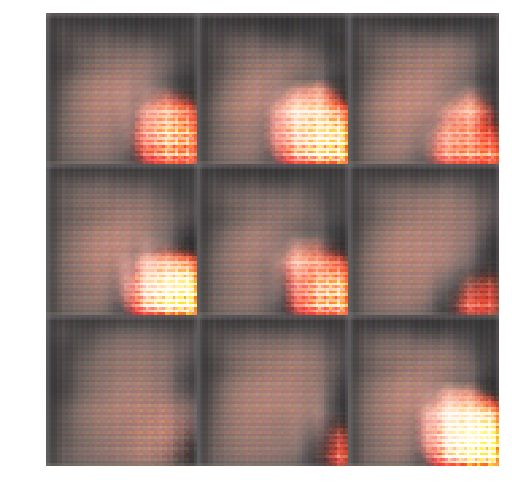

Epoch 1/10 Step 110... Discriminator Loss: 1.2933... Generator Loss: 0.7140
Epoch 1/10 Step 120... Discriminator Loss: 1.2875... Generator Loss: 0.5693
Epoch 1/10 Step 130... Discriminator Loss: 1.4233... Generator Loss: 0.6182
Epoch 1/10 Step 140... Discriminator Loss: 1.1365... Generator Loss: 1.0592
Epoch 1/10 Step 150... Discriminator Loss: 1.2488... Generator Loss: 0.8065
Epoch 1/10 Step 160... Discriminator Loss: 1.2836... Generator Loss: 0.7683
Epoch 1/10 Step 170... Discriminator Loss: 1.4231... Generator Loss: 1.6434
Epoch 1/10 Step 180... Discriminator Loss: 1.0980... Generator Loss: 1.1856
Epoch 1/10 Step 190... Discriminator Loss: 1.1915... Generator Loss: 0.8928
Epoch 1/10 Step 200... Discriminator Loss: 1.2057... Generator Loss: 0.8539


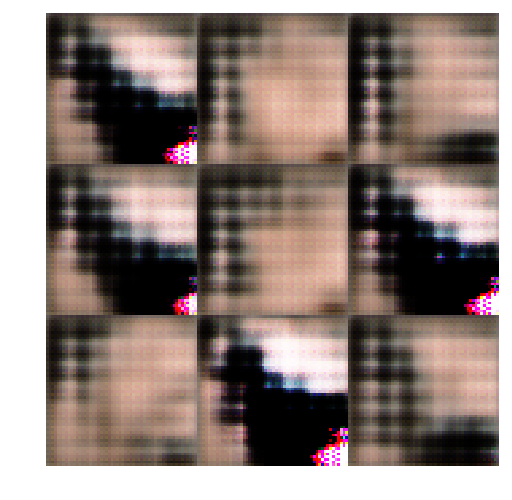

Epoch 1/10 Step 210... Discriminator Loss: 1.2503... Generator Loss: 1.0270
Epoch 1/10 Step 220... Discriminator Loss: 1.4150... Generator Loss: 0.8723
Epoch 1/10 Step 230... Discriminator Loss: 1.2240... Generator Loss: 1.0648
Epoch 1/10 Step 240... Discriminator Loss: 1.2525... Generator Loss: 0.8671
Epoch 1/10 Step 250... Discriminator Loss: 1.2528... Generator Loss: 1.0943
Epoch 1/10 Step 260... Discriminator Loss: 1.3526... Generator Loss: 0.9922
Epoch 1/10 Step 270... Discriminator Loss: 1.2077... Generator Loss: 1.3390
Epoch 1/10 Step 280... Discriminator Loss: 1.1518... Generator Loss: 1.3766
Epoch 1/10 Step 290... Discriminator Loss: 1.2402... Generator Loss: 0.9432
Epoch 1/10 Step 300... Discriminator Loss: 1.2720... Generator Loss: 0.8266


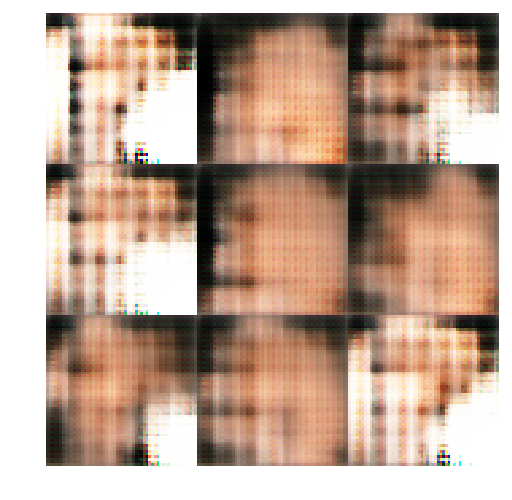

Epoch 1/10 Step 310... Discriminator Loss: 1.3309... Generator Loss: 0.6885
Epoch 1/10 Step 320... Discriminator Loss: 1.3482... Generator Loss: 0.8315
Epoch 1/10 Step 330... Discriminator Loss: 1.3858... Generator Loss: 0.8310
Epoch 1/10 Step 340... Discriminator Loss: 1.0704... Generator Loss: 0.8532
Epoch 1/10 Step 350... Discriminator Loss: 1.3519... Generator Loss: 1.1890
Epoch 1/10 Step 360... Discriminator Loss: 1.1973... Generator Loss: 0.7679
Epoch 1/10 Step 370... Discriminator Loss: 1.5909... Generator Loss: 0.4119
Epoch 1/10 Step 380... Discriminator Loss: 1.2560... Generator Loss: 0.9258
Epoch 1/10 Step 390... Discriminator Loss: 1.0986... Generator Loss: 1.1545
Epoch 1/10 Step 400... Discriminator Loss: 1.1022... Generator Loss: 1.0141


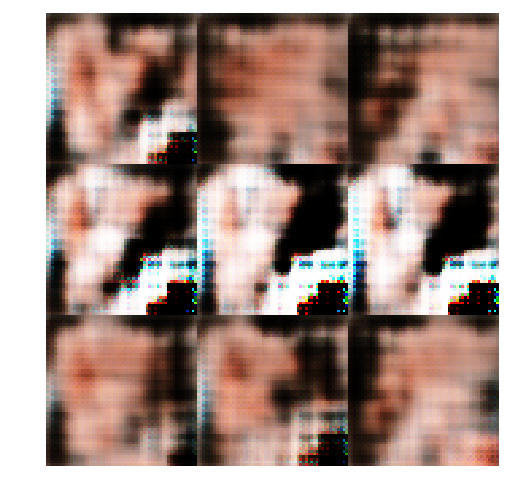

Epoch 1/10 Step 410... Discriminator Loss: 1.0839... Generator Loss: 1.0946
Epoch 1/10 Step 420... Discriminator Loss: 1.0760... Generator Loss: 1.2962
Epoch 1/10 Step 430... Discriminator Loss: 1.6237... Generator Loss: 0.3974
Epoch 1/10 Step 440... Discriminator Loss: 1.0837... Generator Loss: 1.0660
Epoch 1/10 Step 450... Discriminator Loss: 1.3228... Generator Loss: 1.1780
Epoch 1/10 Step 460... Discriminator Loss: 1.1714... Generator Loss: 1.0704
Epoch 1/10 Step 470... Discriminator Loss: 1.5563... Generator Loss: 0.4624
Epoch 1/10 Step 480... Discriminator Loss: 1.1749... Generator Loss: 1.0269
Epoch 1/10 Step 490... Discriminator Loss: 0.9930... Generator Loss: 1.1317
Epoch 1/10 Step 500... Discriminator Loss: 1.0906... Generator Loss: 0.9849


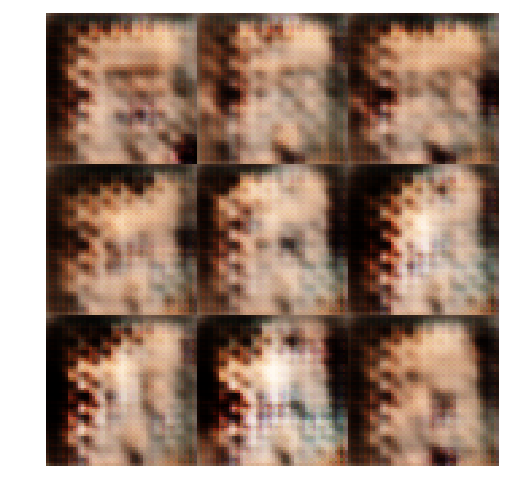

Epoch 1/10 Step 510... Discriminator Loss: 1.0964... Generator Loss: 1.3810
Epoch 1/10 Step 520... Discriminator Loss: 1.6977... Generator Loss: 0.4142
Epoch 1/10 Step 530... Discriminator Loss: 1.3647... Generator Loss: 0.8700
Epoch 1/10 Step 540... Discriminator Loss: 1.1500... Generator Loss: 1.4306
Epoch 1/10 Step 550... Discriminator Loss: 2.8733... Generator Loss: 3.5416
Epoch 1/10 Step 560... Discriminator Loss: 1.2984... Generator Loss: 0.8346
Epoch 1/10 Step 570... Discriminator Loss: 1.0269... Generator Loss: 1.1030
Epoch 1/10 Step 580... Discriminator Loss: 1.0888... Generator Loss: 1.1958
Epoch 1/10 Step 590... Discriminator Loss: 1.5804... Generator Loss: 0.4275
Epoch 1/10 Step 600... Discriminator Loss: 1.0293... Generator Loss: 1.1455


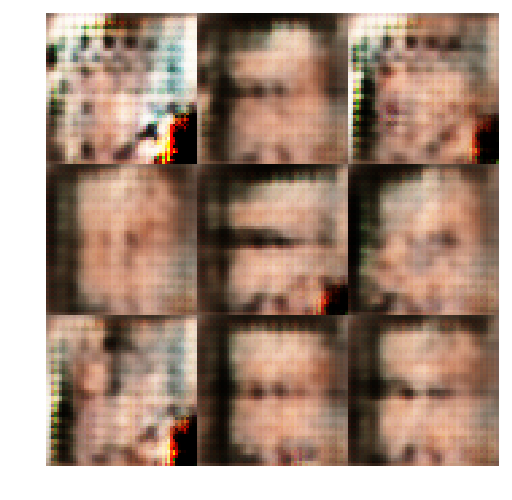

Epoch 1/10 Step 610... Discriminator Loss: 1.1350... Generator Loss: 0.9405
Epoch 1/10 Step 620... Discriminator Loss: 1.0277... Generator Loss: 1.0675
Epoch 1/10 Step 630... Discriminator Loss: 1.1373... Generator Loss: 0.9965
Epoch 1/10 Step 640... Discriminator Loss: 1.2123... Generator Loss: 0.9629
Epoch 1/10 Step 650... Discriminator Loss: 1.3979... Generator Loss: 0.6168
Epoch 1/10 Step 660... Discriminator Loss: 1.0623... Generator Loss: 1.0582
Epoch 1/10 Step 670... Discriminator Loss: 1.1005... Generator Loss: 0.9484
Epoch 1/10 Step 680... Discriminator Loss: 1.0746... Generator Loss: 1.2111
Epoch 1/10 Step 690... Discriminator Loss: 1.2472... Generator Loss: 0.7233
Epoch 1/10 Step 700... Discriminator Loss: 1.1456... Generator Loss: 1.0803


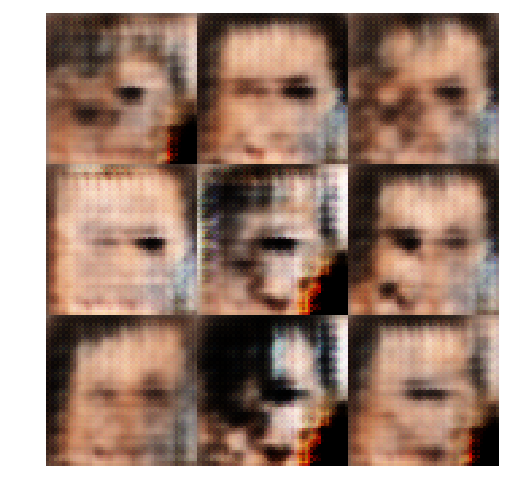

Epoch 1/10 Step 710... Discriminator Loss: 1.0762... Generator Loss: 1.6063
Epoch 1/10 Step 720... Discriminator Loss: 1.2156... Generator Loss: 0.9750
Epoch 1/10 Step 730... Discriminator Loss: 1.1527... Generator Loss: 0.9278
Epoch 1/10 Step 740... Discriminator Loss: 1.1564... Generator Loss: 1.2111
Epoch 1/10 Step 750... Discriminator Loss: 1.3045... Generator Loss: 1.2594
Epoch 1/10 Step 760... Discriminator Loss: 1.0874... Generator Loss: 0.9903
Epoch 1/10 Step 770... Discriminator Loss: 1.5618... Generator Loss: 0.5142
Epoch 1/10 Step 780... Discriminator Loss: 1.1957... Generator Loss: 0.9632
Epoch 1/10 Step 790... Discriminator Loss: 1.2111... Generator Loss: 1.1932
Epoch 1/10 Step 800... Discriminator Loss: 1.1305... Generator Loss: 0.8871


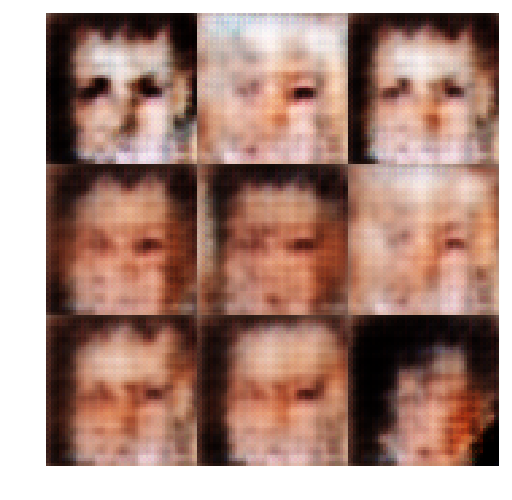

Epoch 1/10 Step 810... Discriminator Loss: 1.0927... Generator Loss: 1.1500
Epoch 1/10 Step 820... Discriminator Loss: 1.6624... Generator Loss: 2.2091
Epoch 1/10 Step 830... Discriminator Loss: 1.0691... Generator Loss: 0.9433
Epoch 1/10 Step 840... Discriminator Loss: 1.1880... Generator Loss: 1.1588
Epoch 1/10 Step 850... Discriminator Loss: 1.3689... Generator Loss: 0.7262
Epoch 1/10 Step 860... Discriminator Loss: 2.3406... Generator Loss: 2.6970
Epoch 1/10 Step 870... Discriminator Loss: 1.1883... Generator Loss: 1.2474
Epoch 1/10 Step 880... Discriminator Loss: 1.4175... Generator Loss: 1.0849
Epoch 1/10 Step 890... Discriminator Loss: 1.2216... Generator Loss: 0.9372
Epoch 1/10 Step 900... Discriminator Loss: 1.1745... Generator Loss: 0.9449


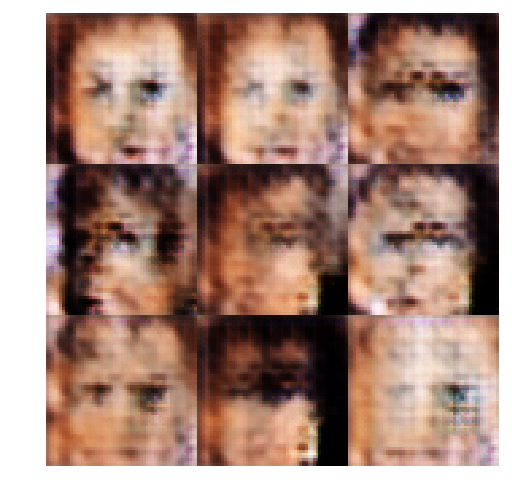

Epoch 1/10 Step 910... Discriminator Loss: 1.2191... Generator Loss: 0.8077
Epoch 1/10 Step 920... Discriminator Loss: 1.2852... Generator Loss: 1.4782
Epoch 1/10 Step 930... Discriminator Loss: 1.2684... Generator Loss: 0.6805
Epoch 1/10 Step 940... Discriminator Loss: 1.2519... Generator Loss: 0.8477
Epoch 1/10 Step 950... Discriminator Loss: 1.1066... Generator Loss: 0.9124
Epoch 1/10 Step 960... Discriminator Loss: 1.1313... Generator Loss: 1.2830
Epoch 1/10 Step 970... Discriminator Loss: 1.1884... Generator Loss: 1.5269
Epoch 1/10 Step 980... Discriminator Loss: 1.1870... Generator Loss: 1.0017
Epoch 1/10 Step 990... Discriminator Loss: 1.1663... Generator Loss: 0.9503
Epoch 1/10 Step 1000... Discriminator Loss: 0.9790... Generator Loss: 1.3274


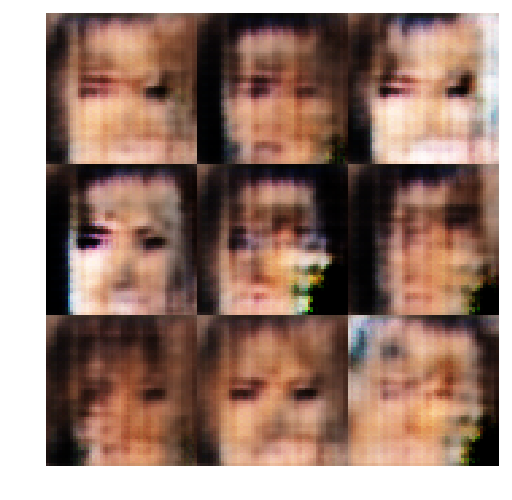

Epoch 1/10 Step 1010... Discriminator Loss: 1.3138... Generator Loss: 0.5773
Epoch 1/10 Step 1020... Discriminator Loss: 1.2133... Generator Loss: 1.0159
Epoch 1/10 Step 1030... Discriminator Loss: 1.2584... Generator Loss: 1.7975
Epoch 1/10 Step 1040... Discriminator Loss: 1.2158... Generator Loss: 0.8693
Epoch 1/10 Step 1050... Discriminator Loss: 1.3838... Generator Loss: 2.0106
Epoch 1/10 Step 1060... Discriminator Loss: 1.1614... Generator Loss: 0.9312
Epoch 1/10 Step 1070... Discriminator Loss: 1.1767... Generator Loss: 0.9822
Epoch 1/10 Step 1080... Discriminator Loss: 1.1950... Generator Loss: 1.0375
Epoch 1/10 Step 1090... Discriminator Loss: 1.2157... Generator Loss: 0.9097
Epoch 1/10 Step 1100... Discriminator Loss: 1.3975... Generator Loss: 0.6631


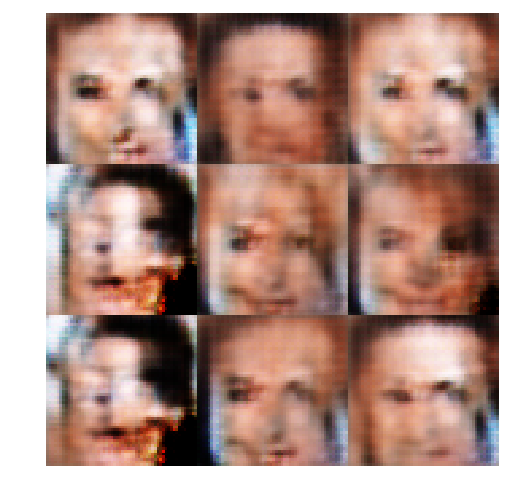

Epoch 1/10 Step 1110... Discriminator Loss: 1.8063... Generator Loss: 0.3696
Epoch 1/10 Step 1120... Discriminator Loss: 1.2775... Generator Loss: 0.7282
Epoch 1/10 Step 1130... Discriminator Loss: 1.1588... Generator Loss: 1.1221
Epoch 1/10 Step 1140... Discriminator Loss: 1.0910... Generator Loss: 1.0531
Epoch 1/10 Step 1150... Discriminator Loss: 1.4154... Generator Loss: 1.3394
Epoch 1/10 Step 1160... Discriminator Loss: 1.1947... Generator Loss: 1.0530
Epoch 1/10 Step 1170... Discriminator Loss: 1.0856... Generator Loss: 1.1303
Epoch 1/10 Step 1180... Discriminator Loss: 2.1161... Generator Loss: 2.8770
Epoch 1/10 Step 1190... Discriminator Loss: 1.2258... Generator Loss: 0.9899
Epoch 1/10 Step 1200... Discriminator Loss: 1.0339... Generator Loss: 1.0143


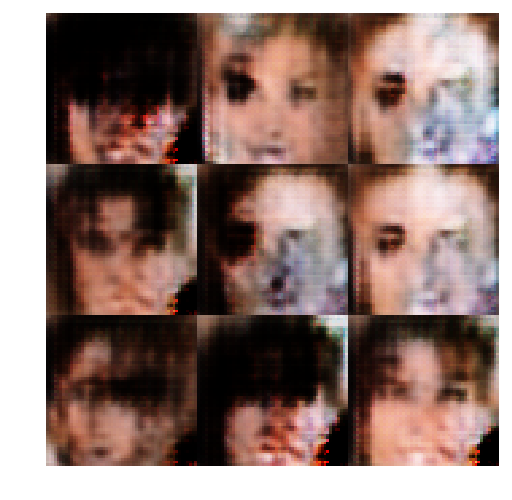

Epoch 1/10 Step 1210... Discriminator Loss: 1.1634... Generator Loss: 1.0089
Epoch 1/10 Step 1220... Discriminator Loss: 1.1902... Generator Loss: 0.9182
Epoch 1/10 Step 1230... Discriminator Loss: 1.6586... Generator Loss: 0.4159
Epoch 1/10 Step 1240... Discriminator Loss: 1.2260... Generator Loss: 1.4944
Epoch 1/10 Step 1250... Discriminator Loss: 1.2230... Generator Loss: 0.8179
Epoch 1/10 Step 1260... Discriminator Loss: 1.5427... Generator Loss: 0.4625
Epoch 1/10 Step 1270... Discriminator Loss: 1.1108... Generator Loss: 0.9627
Epoch 1/10 Step 1280... Discriminator Loss: 1.6248... Generator Loss: 1.9362
Epoch 1/10 Step 1290... Discriminator Loss: 1.4368... Generator Loss: 0.6137
Epoch 1/10 Step 1300... Discriminator Loss: 1.1375... Generator Loss: 0.8469


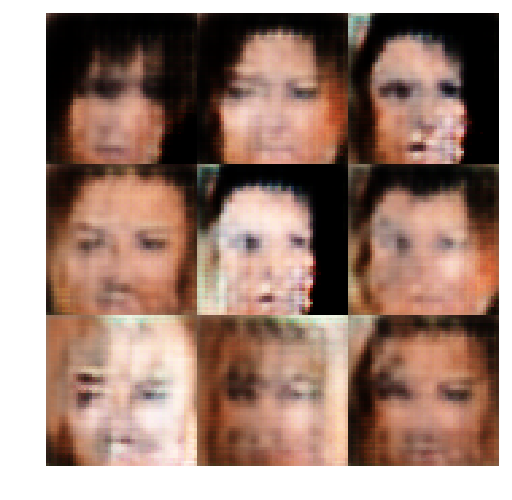

Epoch 1/10 Step 1310... Discriminator Loss: 1.2598... Generator Loss: 1.0836
Epoch 1/10 Step 1320... Discriminator Loss: 1.1819... Generator Loss: 0.9106
Epoch 1/10 Step 1330... Discriminator Loss: 1.3233... Generator Loss: 0.9373
Epoch 1/10 Step 1340... Discriminator Loss: 1.2133... Generator Loss: 0.9290
Epoch 1/10 Step 1350... Discriminator Loss: 1.3408... Generator Loss: 1.6123
Epoch 1/10 Step 1360... Discriminator Loss: 1.2108... Generator Loss: 0.8319
Epoch 1/10 Step 1370... Discriminator Loss: 1.0812... Generator Loss: 1.1749
Epoch 1/10 Step 1380... Discriminator Loss: 1.2548... Generator Loss: 0.9804
Epoch 1/10 Step 1390... Discriminator Loss: 1.1662... Generator Loss: 0.9815
Epoch 1/10 Step 1400... Discriminator Loss: 1.1434... Generator Loss: 0.9795


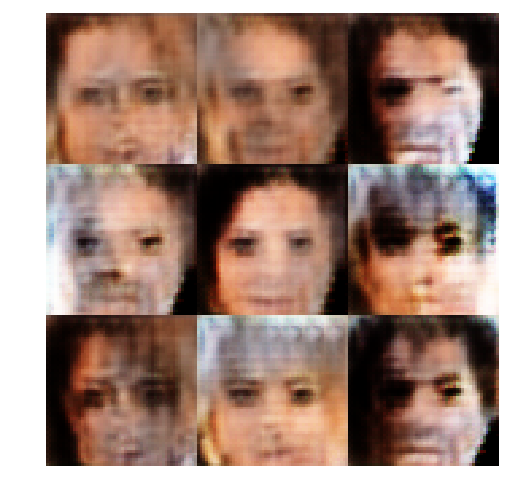

Epoch 1/10 Step 1410... Discriminator Loss: 1.9190... Generator Loss: 2.5213
Epoch 1/10 Step 1420... Discriminator Loss: 1.2166... Generator Loss: 0.9651
Epoch 1/10 Step 1430... Discriminator Loss: 1.2647... Generator Loss: 0.7623
Epoch 1/10 Step 1440... Discriminator Loss: 1.0914... Generator Loss: 1.0031
Epoch 1/10 Step 1450... Discriminator Loss: 1.0560... Generator Loss: 0.8682
Epoch 1/10 Step 1460... Discriminator Loss: 1.1583... Generator Loss: 1.5405
Epoch 1/10 Step 1470... Discriminator Loss: 1.0931... Generator Loss: 1.3188
Epoch 1/10 Step 1480... Discriminator Loss: 1.3131... Generator Loss: 0.6613
Epoch 1/10 Step 1490... Discriminator Loss: 1.2077... Generator Loss: 0.8793
Epoch 1/10 Step 1500... Discriminator Loss: 1.6473... Generator Loss: 2.3762


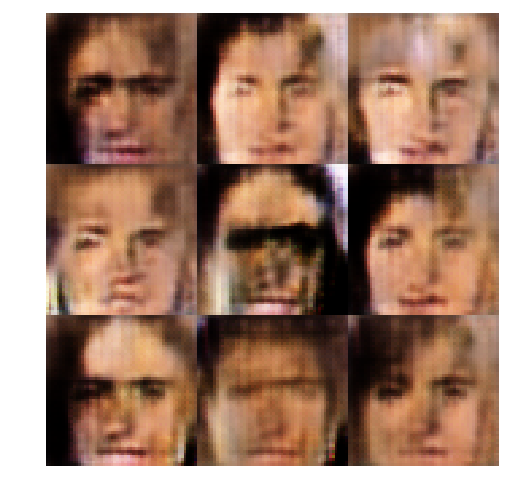

Epoch 1/10 Step 1510... Discriminator Loss: 0.9939... Generator Loss: 1.0985
Epoch 1/10 Step 1520... Discriminator Loss: 1.1717... Generator Loss: 1.5031
Epoch 1/10 Step 1530... Discriminator Loss: 1.0724... Generator Loss: 1.1731
Epoch 1/10 Step 1540... Discriminator Loss: 1.0419... Generator Loss: 1.1534
Epoch 1/10 Step 1550... Discriminator Loss: 1.0832... Generator Loss: 1.3033
Epoch 1/10 Step 1560... Discriminator Loss: 1.1515... Generator Loss: 1.1504
Epoch 1/10 Step 1570... Discriminator Loss: 0.9931... Generator Loss: 1.1064
Epoch 1/10 Step 1580... Discriminator Loss: 1.4612... Generator Loss: 0.4887
Epoch 1/10 Step 1590... Discriminator Loss: 1.1436... Generator Loss: 1.0585
Epoch 1/10 Step 1600... Discriminator Loss: 1.0492... Generator Loss: 1.0343


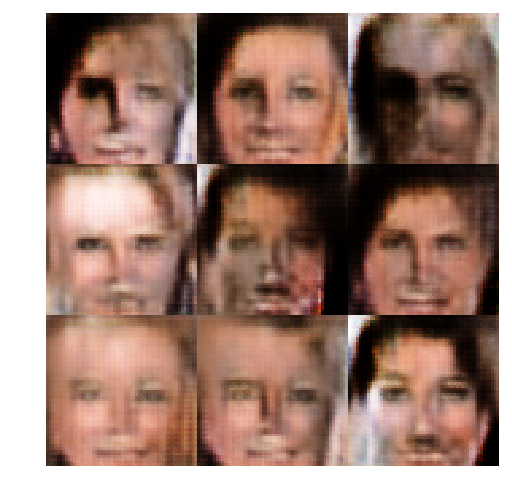

Epoch 1/10 Step 1610... Discriminator Loss: 1.1417... Generator Loss: 0.9581
Epoch 1/10 Step 1620... Discriminator Loss: 1.0138... Generator Loss: 1.1180
Epoch 1/10 Step 1630... Discriminator Loss: 1.0631... Generator Loss: 1.1873
Epoch 1/10 Step 1640... Discriminator Loss: 1.2195... Generator Loss: 0.9000
Epoch 1/10 Step 1650... Discriminator Loss: 1.1307... Generator Loss: 1.2807
Epoch 1/10 Step 1660... Discriminator Loss: 1.5488... Generator Loss: 2.2662
Epoch 1/10 Step 1670... Discriminator Loss: 1.0487... Generator Loss: 1.3418
Epoch 1/10 Step 1680... Discriminator Loss: 1.0980... Generator Loss: 1.2937
Epoch 1/10 Step 1690... Discriminator Loss: 1.2838... Generator Loss: 1.9483
Epoch 1/10 Step 1700... Discriminator Loss: 1.3024... Generator Loss: 0.7313


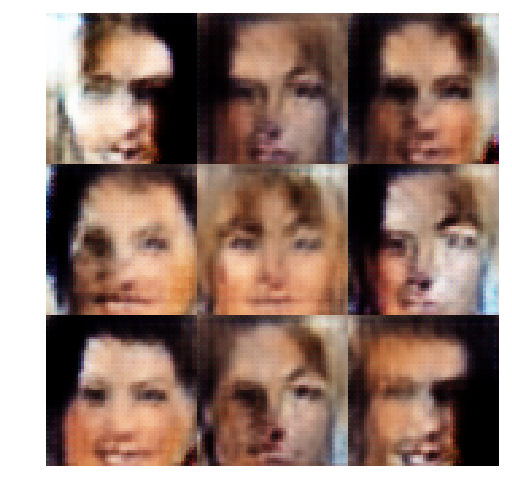

Epoch 1/10 Step 1710... Discriminator Loss: 1.1747... Generator Loss: 1.1902
Epoch 1/10 Step 1720... Discriminator Loss: 1.1150... Generator Loss: 1.7833
Epoch 1/10 Step 1730... Discriminator Loss: 0.9966... Generator Loss: 1.2084
Epoch 1/10 Step 1740... Discriminator Loss: 1.1266... Generator Loss: 0.9608
Epoch 1/10 Step 1750... Discriminator Loss: 1.6930... Generator Loss: 2.4099
Epoch 1/10 Step 1760... Discriminator Loss: 1.0323... Generator Loss: 1.3592
Epoch 1/10 Step 1770... Discriminator Loss: 1.1250... Generator Loss: 1.1942
Epoch 1/10 Step 1780... Discriminator Loss: 1.1243... Generator Loss: 0.8634
Epoch 1/10 Step 1790... Discriminator Loss: 1.1995... Generator Loss: 1.3713
Epoch 1/10 Step 1800... Discriminator Loss: 1.0495... Generator Loss: 1.4075


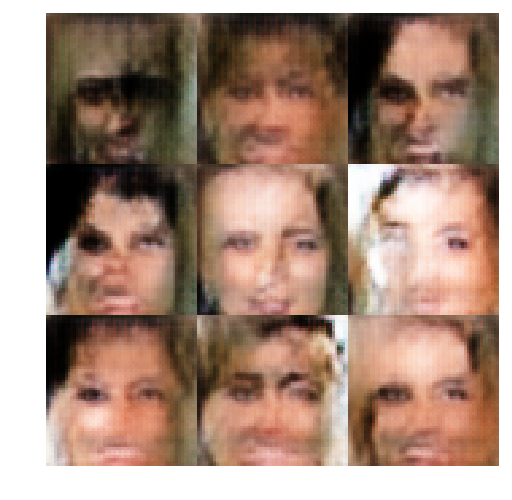

Epoch 1/10 Step 1810... Discriminator Loss: 1.0714... Generator Loss: 1.3028
Epoch 1/10 Step 1820... Discriminator Loss: 1.3625... Generator Loss: 0.8758
Epoch 1/10 Step 1830... Discriminator Loss: 1.2166... Generator Loss: 0.9732
Epoch 1/10 Step 1840... Discriminator Loss: 1.2880... Generator Loss: 1.2643
Epoch 1/10 Step 1850... Discriminator Loss: 1.1804... Generator Loss: 0.9490
Epoch 1/10 Step 1860... Discriminator Loss: 1.2117... Generator Loss: 0.7713
Epoch 1/10 Step 1870... Discriminator Loss: 0.9937... Generator Loss: 1.1516
Epoch 1/10 Step 1880... Discriminator Loss: 1.3015... Generator Loss: 0.9452
Epoch 1/10 Step 1890... Discriminator Loss: 1.1150... Generator Loss: 1.0645
Epoch 1/10 Step 1900... Discriminator Loss: 1.1798... Generator Loss: 0.9433


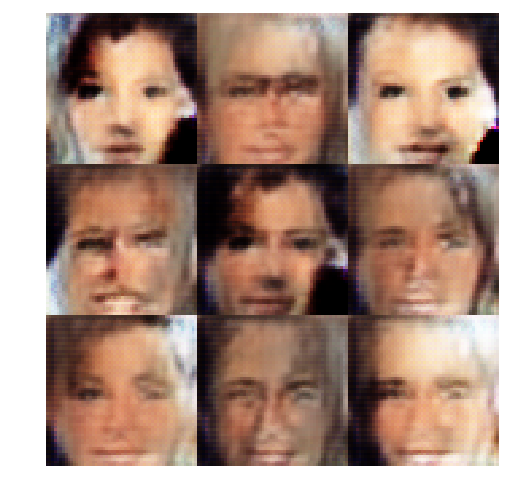

Epoch 1/10 Step 1910... Discriminator Loss: 0.9932... Generator Loss: 1.1836
Epoch 1/10 Step 1920... Discriminator Loss: 1.0617... Generator Loss: 1.3815
Epoch 1/10 Step 1930... Discriminator Loss: 1.0525... Generator Loss: 1.2916
Epoch 1/10 Step 1940... Discriminator Loss: 1.0833... Generator Loss: 1.3772
Epoch 1/10 Step 1950... Discriminator Loss: 1.0665... Generator Loss: 1.0568
Epoch 1/10 Step 1960... Discriminator Loss: 1.2770... Generator Loss: 0.8938
Epoch 1/10 Step 1970... Discriminator Loss: 1.1803... Generator Loss: 1.0431
Epoch 1/10 Step 1980... Discriminator Loss: 1.1620... Generator Loss: 1.0710
Epoch 1/10 Step 1990... Discriminator Loss: 1.3718... Generator Loss: 1.8728
Epoch 1/10 Step 2000... Discriminator Loss: 1.1671... Generator Loss: 1.1045


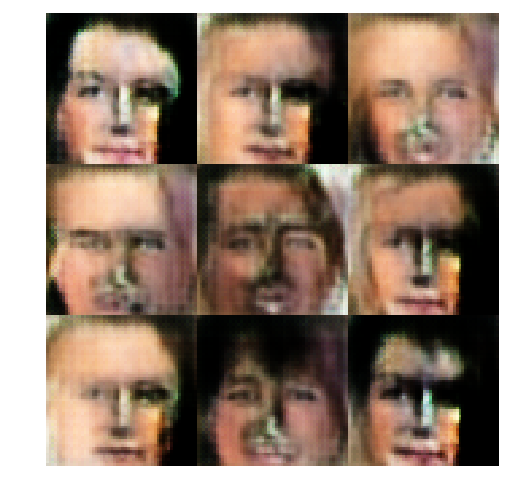

Epoch 1/10 Step 2010... Discriminator Loss: 2.1167... Generator Loss: 2.5272
Epoch 1/10 Step 2020... Discriminator Loss: 1.3625... Generator Loss: 0.7480
Epoch 1/10 Step 2030... Discriminator Loss: 1.1150... Generator Loss: 1.0430
Epoch 1/10 Step 2040... Discriminator Loss: 1.2086... Generator Loss: 0.9541
Epoch 1/10 Step 2050... Discriminator Loss: 1.3229... Generator Loss: 1.0577
Epoch 1/10 Step 2060... Discriminator Loss: 1.0839... Generator Loss: 1.3796
Epoch 1/10 Step 2070... Discriminator Loss: 1.1616... Generator Loss: 1.0561
Epoch 1/10 Step 2080... Discriminator Loss: 1.1417... Generator Loss: 1.0597
Epoch 1/10 Step 2090... Discriminator Loss: 1.1455... Generator Loss: 1.0828
Epoch 1/10 Step 2100... Discriminator Loss: 1.0951... Generator Loss: 1.5974


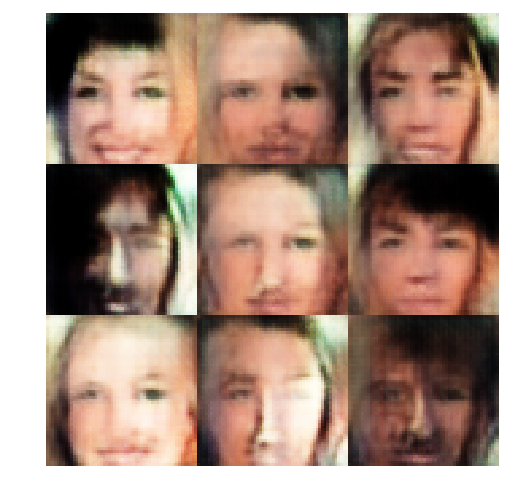

Epoch 1/10 Step 2110... Discriminator Loss: 1.1081... Generator Loss: 1.0037
Epoch 1/10 Step 2120... Discriminator Loss: 1.1280... Generator Loss: 1.5979
Epoch 1/10 Step 2130... Discriminator Loss: 1.2193... Generator Loss: 0.7005
Epoch 1/10 Step 2140... Discriminator Loss: 1.1359... Generator Loss: 1.2612
Epoch 1/10 Step 2150... Discriminator Loss: 1.2158... Generator Loss: 1.0072
Epoch 1/10 Step 2160... Discriminator Loss: 1.2086... Generator Loss: 1.0576
Epoch 1/10 Step 2170... Discriminator Loss: 1.1465... Generator Loss: 1.5155
Epoch 1/10 Step 2180... Discriminator Loss: 1.0730... Generator Loss: 1.5496
Epoch 1/10 Step 2190... Discriminator Loss: 1.1217... Generator Loss: 1.5038
Epoch 1/10 Step 2200... Discriminator Loss: 1.1680... Generator Loss: 0.9429


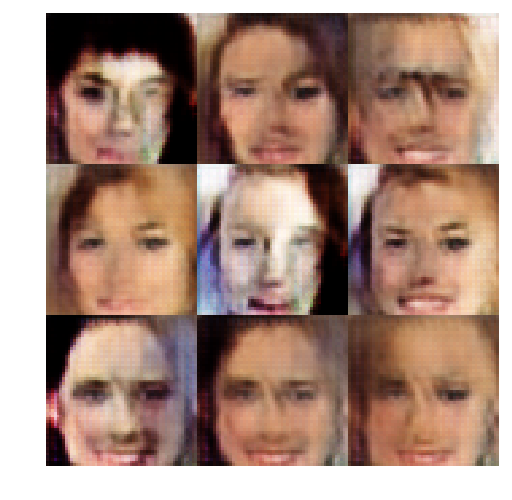

Epoch 1/10 Step 2210... Discriminator Loss: 1.1820... Generator Loss: 0.9953
Epoch 1/10 Step 2220... Discriminator Loss: 1.1739... Generator Loss: 1.0183
Epoch 1/10 Step 2230... Discriminator Loss: 1.1535... Generator Loss: 1.0009
Epoch 1/10 Step 2240... Discriminator Loss: 1.1355... Generator Loss: 1.0602
Epoch 1/10 Step 2250... Discriminator Loss: 1.1398... Generator Loss: 1.0895
Epoch 1/10 Step 2260... Discriminator Loss: 1.0545... Generator Loss: 1.2765
Epoch 1/10 Step 2270... Discriminator Loss: 1.1777... Generator Loss: 0.9707
Epoch 1/10 Step 2280... Discriminator Loss: 1.1675... Generator Loss: 0.9931
Epoch 1/10 Step 2290... Discriminator Loss: 1.2201... Generator Loss: 1.5948
Epoch 1/10 Step 2300... Discriminator Loss: 1.0641... Generator Loss: 1.0407


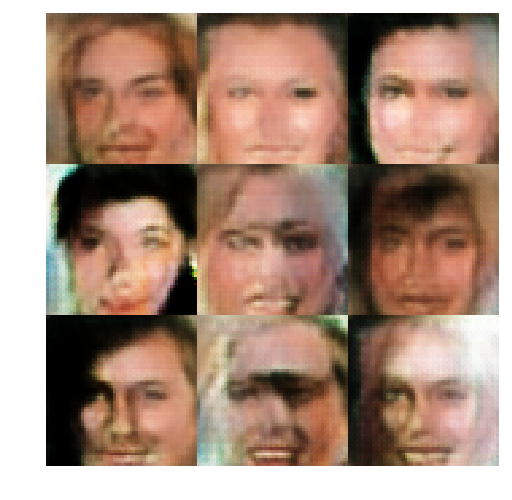

Epoch 1/10 Step 2310... Discriminator Loss: 1.0884... Generator Loss: 1.1432
Epoch 1/10 Step 2320... Discriminator Loss: 1.1522... Generator Loss: 0.8800
Epoch 1/10 Step 2330... Discriminator Loss: 1.3570... Generator Loss: 0.8057
Epoch 1/10 Step 2340... Discriminator Loss: 1.1950... Generator Loss: 1.0115
Epoch 1/10 Step 2350... Discriminator Loss: 1.1164... Generator Loss: 1.1542
Epoch 1/10 Step 2360... Discriminator Loss: 1.2319... Generator Loss: 0.8559
Epoch 1/10 Step 2370... Discriminator Loss: 1.2549... Generator Loss: 0.6523
Epoch 1/10 Step 2380... Discriminator Loss: 1.1545... Generator Loss: 1.0733
Epoch 1/10 Step 2390... Discriminator Loss: 1.4652... Generator Loss: 0.5350
Epoch 1/10 Step 2400... Discriminator Loss: 1.1481... Generator Loss: 1.4006


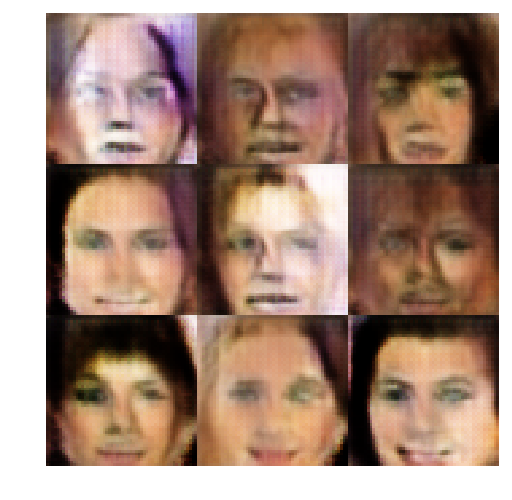

Epoch 1/10 Step 2410... Discriminator Loss: 1.8477... Generator Loss: 2.4939
Epoch 1/10 Step 2420... Discriminator Loss: 1.1880... Generator Loss: 0.9976
Epoch 1/10 Step 2430... Discriminator Loss: 1.0879... Generator Loss: 1.0248
Epoch 1/10 Step 2440... Discriminator Loss: 1.2618... Generator Loss: 0.8099
Epoch 1/10 Step 2450... Discriminator Loss: 1.2351... Generator Loss: 0.8306
Epoch 1/10 Step 2460... Discriminator Loss: 1.2882... Generator Loss: 1.7056
Epoch 1/10 Step 2470... Discriminator Loss: 1.1165... Generator Loss: 1.1936
Epoch 1/10 Step 2480... Discriminator Loss: 1.3083... Generator Loss: 1.0035
Epoch 1/10 Step 2490... Discriminator Loss: 1.2227... Generator Loss: 0.9262
Epoch 1/10 Step 2500... Discriminator Loss: 1.0651... Generator Loss: 0.9991


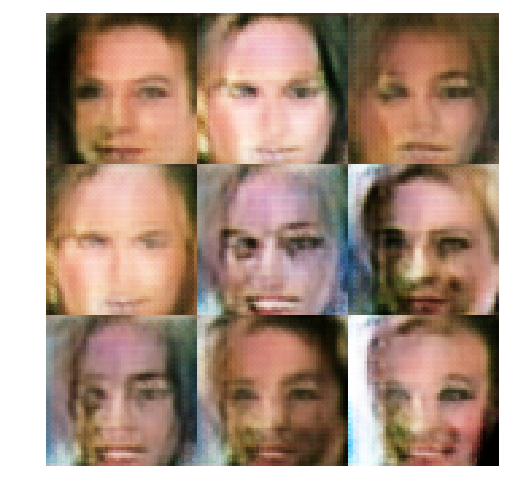

Epoch 1/10 Step 2510... Discriminator Loss: 1.2317... Generator Loss: 0.8227
Epoch 1/10 Step 2520... Discriminator Loss: 1.3547... Generator Loss: 0.6219
Epoch 1/10 Step 2530... Discriminator Loss: 1.1799... Generator Loss: 1.0098
Epoch 1/10 Step 2540... Discriminator Loss: 1.2047... Generator Loss: 1.1146
Epoch 1/10 Step 2550... Discriminator Loss: 1.0685... Generator Loss: 1.0321
Epoch 1/10 Step 2560... Discriminator Loss: 1.3057... Generator Loss: 0.9999
Epoch 1/10 Step 2570... Discriminator Loss: 1.1761... Generator Loss: 0.9715
Epoch 1/10 Step 2580... Discriminator Loss: 1.2717... Generator Loss: 0.8795
Epoch 1/10 Step 2590... Discriminator Loss: 1.2341... Generator Loss: 0.9145
Epoch 1/10 Step 2600... Discriminator Loss: 1.5811... Generator Loss: 0.4714


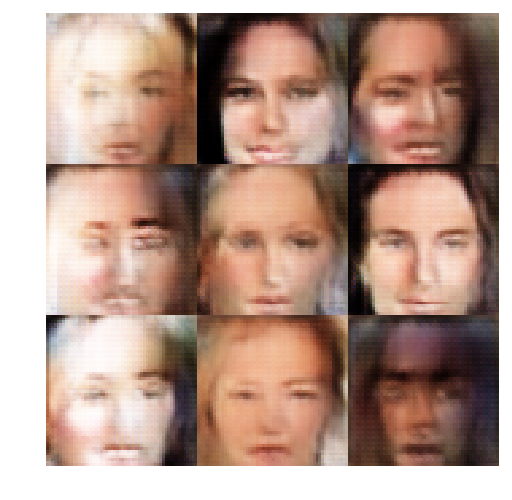

Epoch 1/10 Step 2610... Discriminator Loss: 1.2405... Generator Loss: 0.8724
Epoch 1/10 Step 2620... Discriminator Loss: 1.1381... Generator Loss: 1.0011
Epoch 1/10 Step 2630... Discriminator Loss: 1.3299... Generator Loss: 1.5363
Epoch 1/10 Step 2640... Discriminator Loss: 1.1105... Generator Loss: 1.2422
Epoch 1/10 Step 2650... Discriminator Loss: 1.1832... Generator Loss: 1.1540
Epoch 1/10 Step 2660... Discriminator Loss: 1.1698... Generator Loss: 1.2021
Epoch 1/10 Step 2670... Discriminator Loss: 1.5832... Generator Loss: 2.0700
Epoch 1/10 Step 2680... Discriminator Loss: 1.1226... Generator Loss: 1.0386
Epoch 1/10 Step 2690... Discriminator Loss: 1.1324... Generator Loss: 0.9861
Epoch 1/10 Step 2700... Discriminator Loss: 1.0754... Generator Loss: 1.0915


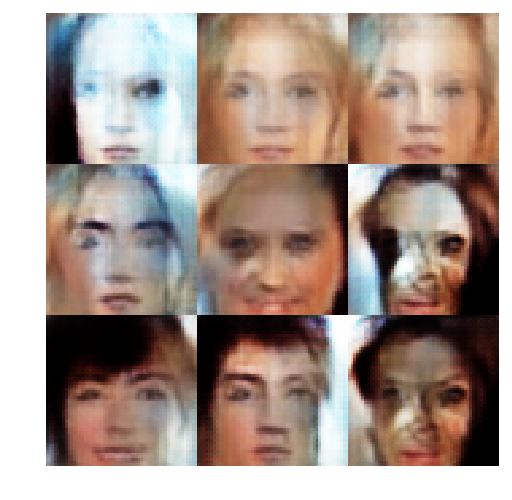

Epoch 1/10 Step 2710... Discriminator Loss: 1.0669... Generator Loss: 1.1484
Epoch 1/10 Step 2720... Discriminator Loss: 1.1108... Generator Loss: 0.9652
Epoch 1/10 Step 2730... Discriminator Loss: 1.1498... Generator Loss: 1.1883
Epoch 1/10 Step 2740... Discriminator Loss: 1.3533... Generator Loss: 1.2793
Epoch 1/10 Step 2750... Discriminator Loss: 1.1846... Generator Loss: 1.2743
Epoch 1/10 Step 2760... Discriminator Loss: 0.9646... Generator Loss: 1.2479
Epoch 1/10 Step 2770... Discriminator Loss: 1.1116... Generator Loss: 1.1483
Epoch 1/10 Step 2780... Discriminator Loss: 1.1050... Generator Loss: 1.0972
Epoch 1/10 Step 2790... Discriminator Loss: 1.3315... Generator Loss: 0.7171
Epoch 1/10 Step 2800... Discriminator Loss: 1.2207... Generator Loss: 0.9600


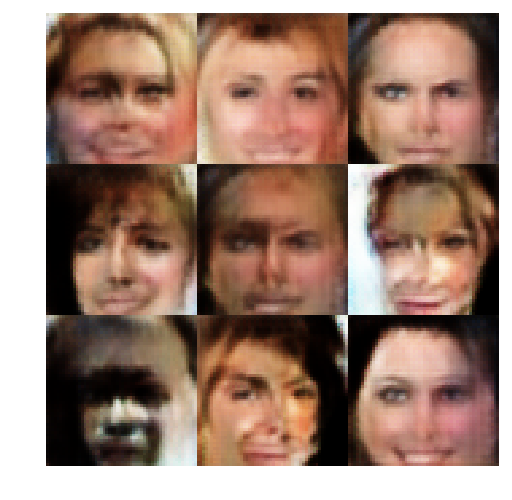

Epoch 1/10 Step 2810... Discriminator Loss: 1.1301... Generator Loss: 1.0371
Epoch 1/10 Step 2820... Discriminator Loss: 1.4022... Generator Loss: 2.1081
Epoch 1/10 Step 2830... Discriminator Loss: 1.1256... Generator Loss: 0.9416
Epoch 1/10 Step 2840... Discriminator Loss: 1.1499... Generator Loss: 1.1347
Epoch 1/10 Step 2850... Discriminator Loss: 1.1098... Generator Loss: 1.0959
Epoch 1/10 Step 2860... Discriminator Loss: 1.4014... Generator Loss: 2.0468
Epoch 1/10 Step 2870... Discriminator Loss: 1.2123... Generator Loss: 0.8538
Epoch 1/10 Step 2880... Discriminator Loss: 1.4611... Generator Loss: 2.3713
Epoch 1/10 Step 2890... Discriminator Loss: 1.1449... Generator Loss: 0.9237
Epoch 1/10 Step 2900... Discriminator Loss: 1.2052... Generator Loss: 0.7955


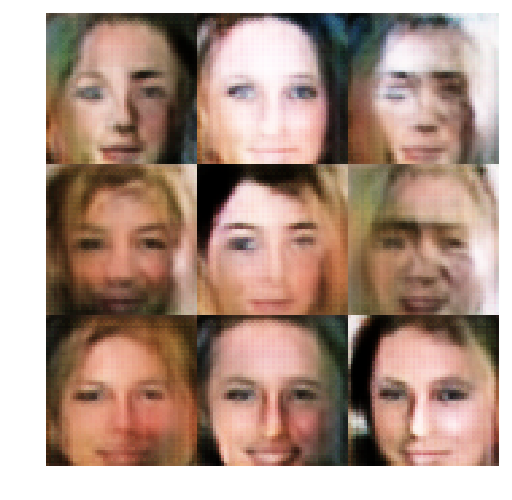

Epoch 1/10 Step 2910... Discriminator Loss: 1.1143... Generator Loss: 1.1705
Epoch 1/10 Step 2920... Discriminator Loss: 1.1121... Generator Loss: 1.0144
Epoch 1/10 Step 2930... Discriminator Loss: 1.0848... Generator Loss: 1.2188
Epoch 1/10 Step 2940... Discriminator Loss: 1.1557... Generator Loss: 0.9733
Epoch 1/10 Step 2950... Discriminator Loss: 1.1493... Generator Loss: 1.3907
Epoch 1/10 Step 2960... Discriminator Loss: 1.1271... Generator Loss: 1.3922
Epoch 1/10 Step 2970... Discriminator Loss: 4.1366... Generator Loss: 0.4328
Epoch 1/10 Step 2980... Discriminator Loss: 12.1084... Generator Loss: 0.0034
Epoch 1/10 Step 2990... Discriminator Loss: 4.5546... Generator Loss: 4.6976
Epoch 1/10 Step 3000... Discriminator Loss: 0.9959... Generator Loss: 1.3050


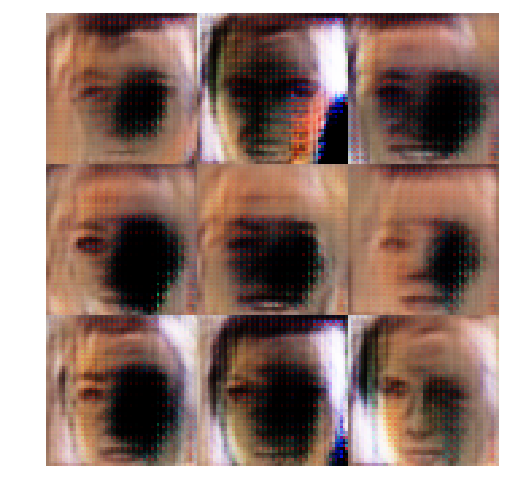

Epoch 1/10 Step 3010... Discriminator Loss: 1.9659... Generator Loss: 0.4394
Epoch 1/10 Step 3020... Discriminator Loss: 1.3175... Generator Loss: 1.2372
Epoch 1/10 Step 3030... Discriminator Loss: 1.1222... Generator Loss: 1.2024
Epoch 1/10 Step 3040... Discriminator Loss: 1.0824... Generator Loss: 1.4791
Epoch 1/10 Step 3050... Discriminator Loss: 1.3033... Generator Loss: 1.0126
Epoch 1/10 Step 3060... Discriminator Loss: 1.1225... Generator Loss: 0.9460
Epoch 1/10 Step 3070... Discriminator Loss: 1.2600... Generator Loss: 0.8167
Epoch 1/10 Step 3080... Discriminator Loss: 1.2269... Generator Loss: 0.8885
Epoch 1/10 Step 3090... Discriminator Loss: 1.1756... Generator Loss: 1.1314
Epoch 1/10 Step 3100... Discriminator Loss: 1.4903... Generator Loss: 1.9535


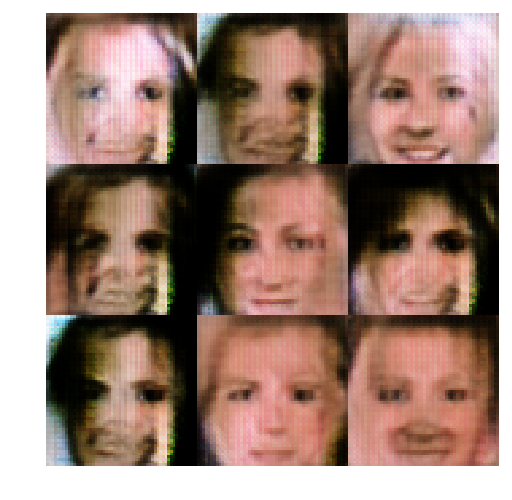

Epoch 1/10 Step 3110... Discriminator Loss: 1.2716... Generator Loss: 1.0972
Epoch 1/10 Step 3120... Discriminator Loss: 1.1987... Generator Loss: 0.7602
Epoch 1/10 Step 3130... Discriminator Loss: 1.3972... Generator Loss: 0.6413
Epoch 1/10 Step 3140... Discriminator Loss: 1.1850... Generator Loss: 1.0039
Epoch 1/10 Step 3150... Discriminator Loss: 1.3387... Generator Loss: 1.5260
Epoch 1/10 Step 3160... Discriminator Loss: 1.2556... Generator Loss: 1.0250
Epoch 2/10 Step 3170... Discriminator Loss: 1.2970... Generator Loss: 0.8057
Epoch 2/10 Step 3180... Discriminator Loss: 1.2660... Generator Loss: 0.9689
Epoch 2/10 Step 3190... Discriminator Loss: 1.2996... Generator Loss: 0.8620
Epoch 2/10 Step 3200... Discriminator Loss: 1.2525... Generator Loss: 0.9325


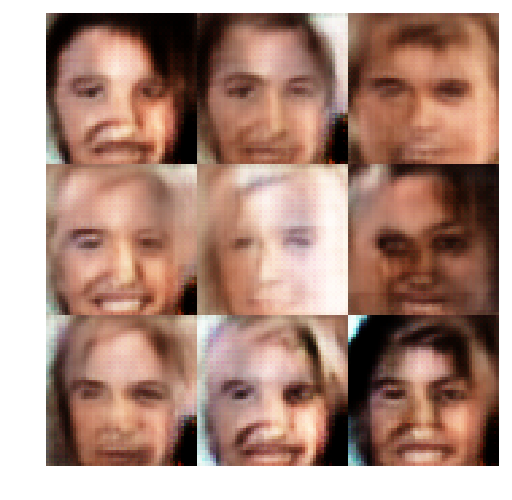

Epoch 2/10 Step 3210... Discriminator Loss: 1.1799... Generator Loss: 1.0828
Epoch 2/10 Step 3220... Discriminator Loss: 1.2626... Generator Loss: 0.9411
Epoch 2/10 Step 3230... Discriminator Loss: 1.2480... Generator Loss: 0.9394
Epoch 2/10 Step 3240... Discriminator Loss: 1.1879... Generator Loss: 0.9360
Epoch 2/10 Step 3250... Discriminator Loss: 1.1847... Generator Loss: 1.2045
Epoch 2/10 Step 3260... Discriminator Loss: 1.1723... Generator Loss: 1.0100
Epoch 2/10 Step 3270... Discriminator Loss: 1.3491... Generator Loss: 0.6223
Epoch 2/10 Step 3280... Discriminator Loss: 1.1469... Generator Loss: 1.0139
Epoch 2/10 Step 3290... Discriminator Loss: 1.2421... Generator Loss: 0.7932
Epoch 2/10 Step 3300... Discriminator Loss: 1.1293... Generator Loss: 1.2281


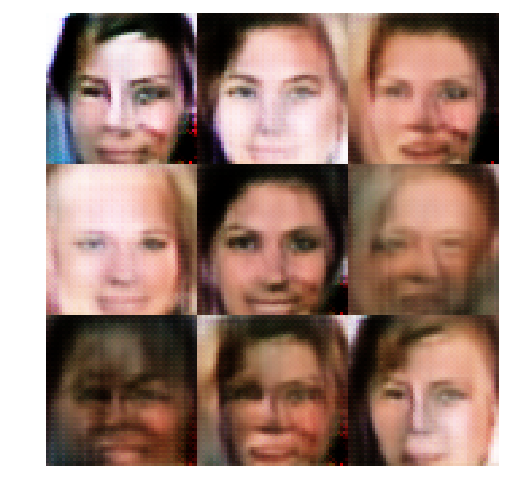

Epoch 2/10 Step 3310... Discriminator Loss: 1.2700... Generator Loss: 0.8667
Epoch 2/10 Step 3320... Discriminator Loss: 1.1860... Generator Loss: 1.2308
Epoch 2/10 Step 3330... Discriminator Loss: 1.1869... Generator Loss: 1.0500
Epoch 2/10 Step 3340... Discriminator Loss: 1.2319... Generator Loss: 1.0862
Epoch 2/10 Step 3350... Discriminator Loss: 1.1768... Generator Loss: 1.1873
Epoch 2/10 Step 3360... Discriminator Loss: 1.2421... Generator Loss: 0.9441
Epoch 2/10 Step 3370... Discriminator Loss: 1.1112... Generator Loss: 1.0301
Epoch 2/10 Step 3380... Discriminator Loss: 1.2448... Generator Loss: 1.0579
Epoch 2/10 Step 3390... Discriminator Loss: 1.0803... Generator Loss: 1.0522
Epoch 2/10 Step 3400... Discriminator Loss: 1.0804... Generator Loss: 1.3857


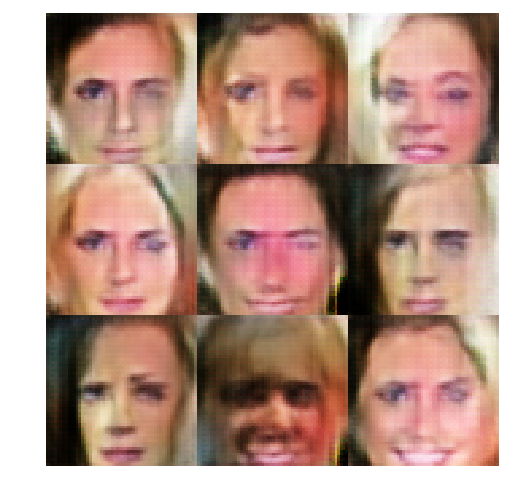

Epoch 2/10 Step 3410... Discriminator Loss: 1.1796... Generator Loss: 0.9915
Epoch 2/10 Step 3420... Discriminator Loss: 1.1335... Generator Loss: 1.0612
Epoch 2/10 Step 3430... Discriminator Loss: 1.1351... Generator Loss: 1.0651
Epoch 2/10 Step 3440... Discriminator Loss: 1.1629... Generator Loss: 1.0289
Epoch 2/10 Step 3450... Discriminator Loss: 1.2783... Generator Loss: 1.3243
Epoch 2/10 Step 3460... Discriminator Loss: 1.1137... Generator Loss: 1.1673
Epoch 2/10 Step 3470... Discriminator Loss: 1.3345... Generator Loss: 1.3892
Epoch 2/10 Step 3480... Discriminator Loss: 1.2313... Generator Loss: 0.8547
Epoch 2/10 Step 3490... Discriminator Loss: 1.2734... Generator Loss: 0.7640
Epoch 2/10 Step 3500... Discriminator Loss: 1.1643... Generator Loss: 1.0223


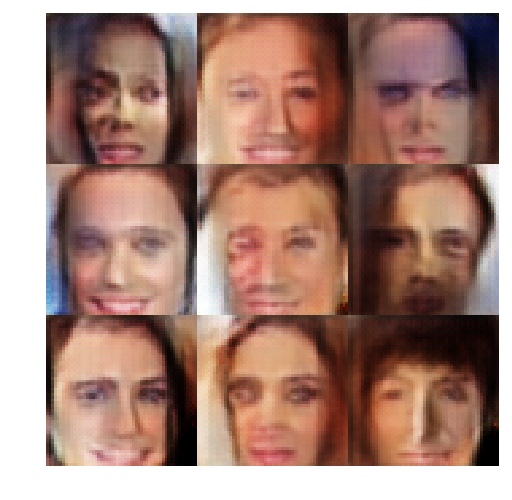

Epoch 2/10 Step 3510... Discriminator Loss: 1.1150... Generator Loss: 1.2838
Epoch 2/10 Step 3520... Discriminator Loss: 1.0878... Generator Loss: 1.1569
Epoch 2/10 Step 3530... Discriminator Loss: 1.2176... Generator Loss: 1.4523
Epoch 2/10 Step 3540... Discriminator Loss: 1.2746... Generator Loss: 0.7863
Epoch 2/10 Step 3550... Discriminator Loss: 1.1193... Generator Loss: 1.0046
Epoch 2/10 Step 3560... Discriminator Loss: 1.0632... Generator Loss: 1.2586
Epoch 2/10 Step 3570... Discriminator Loss: 1.2414... Generator Loss: 0.6589
Epoch 2/10 Step 3580... Discriminator Loss: 1.1614... Generator Loss: 1.2155
Epoch 2/10 Step 3590... Discriminator Loss: 1.1439... Generator Loss: 0.9227
Epoch 2/10 Step 3600... Discriminator Loss: 1.2253... Generator Loss: 1.0047


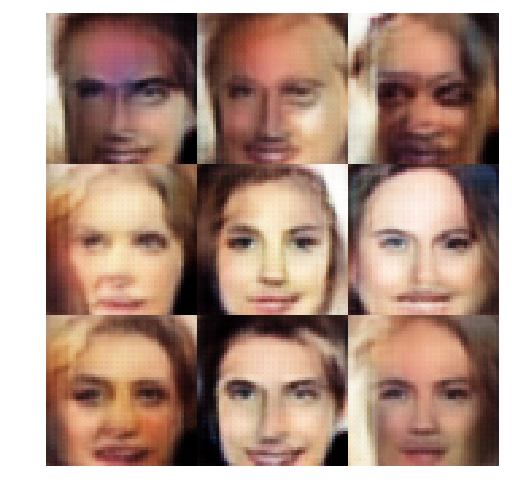

Epoch 2/10 Step 3610... Discriminator Loss: 1.2089... Generator Loss: 1.1190
Epoch 2/10 Step 3620... Discriminator Loss: 1.1775... Generator Loss: 0.7689
Epoch 2/10 Step 3630... Discriminator Loss: 1.1327... Generator Loss: 1.0951
Epoch 2/10 Step 3640... Discriminator Loss: 1.3490... Generator Loss: 0.6316
Epoch 2/10 Step 3650... Discriminator Loss: 1.1522... Generator Loss: 1.1703
Epoch 2/10 Step 3660... Discriminator Loss: 1.1039... Generator Loss: 1.0035
Epoch 2/10 Step 3670... Discriminator Loss: 1.1538... Generator Loss: 0.9106
Epoch 2/10 Step 3680... Discriminator Loss: 1.1541... Generator Loss: 1.1000
Epoch 2/10 Step 3690... Discriminator Loss: 1.0760... Generator Loss: 1.4813
Epoch 2/10 Step 3700... Discriminator Loss: 1.1447... Generator Loss: 0.8716


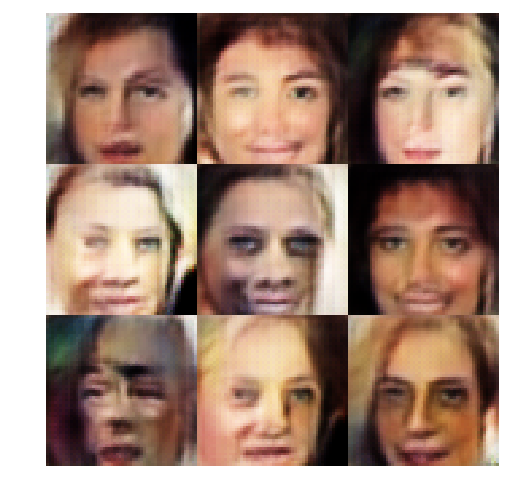

Epoch 2/10 Step 3710... Discriminator Loss: 1.1642... Generator Loss: 1.0496
Epoch 2/10 Step 3720... Discriminator Loss: 1.5919... Generator Loss: 0.4921
Epoch 2/10 Step 3730... Discriminator Loss: 1.5860... Generator Loss: 1.8810
Epoch 2/10 Step 3740... Discriminator Loss: 1.1955... Generator Loss: 0.9500
Epoch 2/10 Step 3750... Discriminator Loss: 1.1896... Generator Loss: 1.3680
Epoch 2/10 Step 3760... Discriminator Loss: 1.1480... Generator Loss: 1.0199
Epoch 2/10 Step 3770... Discriminator Loss: 1.2020... Generator Loss: 0.8475
Epoch 2/10 Step 3780... Discriminator Loss: 1.1580... Generator Loss: 1.1009
Epoch 2/10 Step 3790... Discriminator Loss: 1.1580... Generator Loss: 0.8082
Epoch 2/10 Step 3800... Discriminator Loss: 1.1755... Generator Loss: 0.9436


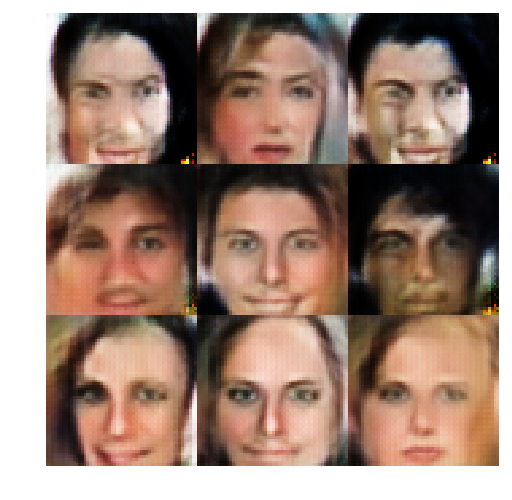

Epoch 2/10 Step 3810... Discriminator Loss: 1.2130... Generator Loss: 1.1062
Epoch 2/10 Step 3820... Discriminator Loss: 1.1352... Generator Loss: 1.1298
Epoch 2/10 Step 3830... Discriminator Loss: 1.6956... Generator Loss: 2.4004
Epoch 2/10 Step 3840... Discriminator Loss: 1.1728... Generator Loss: 1.0182
Epoch 2/10 Step 3850... Discriminator Loss: 1.2481... Generator Loss: 1.2211
Epoch 2/10 Step 3860... Discriminator Loss: 1.1607... Generator Loss: 0.8884
Epoch 2/10 Step 3870... Discriminator Loss: 1.1896... Generator Loss: 1.1523
Epoch 2/10 Step 3880... Discriminator Loss: 1.2043... Generator Loss: 0.8324
Epoch 2/10 Step 3890... Discriminator Loss: 1.1506... Generator Loss: 0.9717
Epoch 2/10 Step 3900... Discriminator Loss: 1.5102... Generator Loss: 0.5408


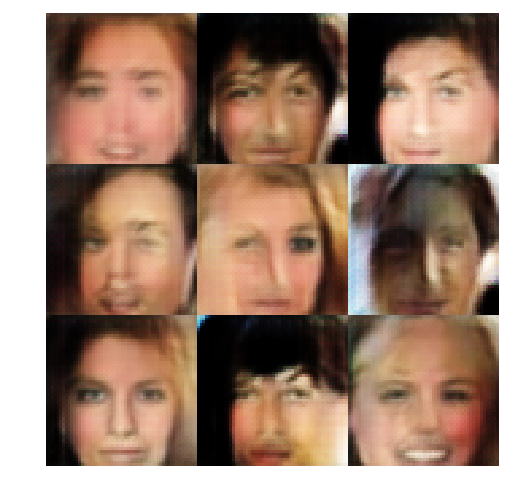

Epoch 2/10 Step 3910... Discriminator Loss: 1.2024... Generator Loss: 0.9914
Epoch 2/10 Step 3920... Discriminator Loss: 1.3471... Generator Loss: 1.4623
Epoch 2/10 Step 3930... Discriminator Loss: 1.1442... Generator Loss: 1.3745
Epoch 2/10 Step 3940... Discriminator Loss: 1.2410... Generator Loss: 0.8240
Epoch 2/10 Step 3950... Discriminator Loss: 1.0880... Generator Loss: 1.1227
Epoch 2/10 Step 3960... Discriminator Loss: 1.1731... Generator Loss: 1.1745
Epoch 2/10 Step 3970... Discriminator Loss: 1.1525... Generator Loss: 0.8657
Epoch 2/10 Step 3980... Discriminator Loss: 1.2174... Generator Loss: 0.8824
Epoch 2/10 Step 3990... Discriminator Loss: 1.0298... Generator Loss: 1.1334
Epoch 2/10 Step 4000... Discriminator Loss: 1.1928... Generator Loss: 1.0176


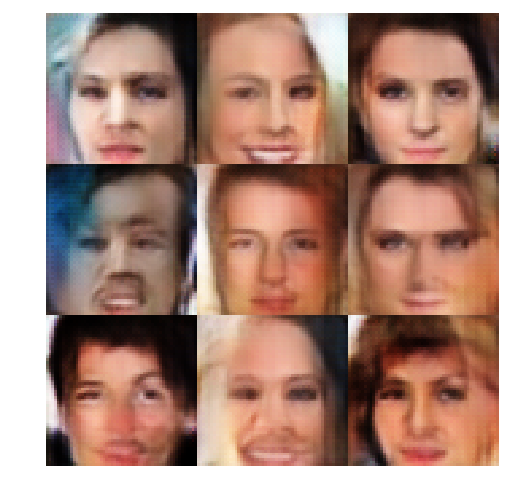

Epoch 2/10 Step 4010... Discriminator Loss: 1.1561... Generator Loss: 1.3787
Epoch 2/10 Step 4020... Discriminator Loss: 1.3434... Generator Loss: 0.6404
Epoch 2/10 Step 4030... Discriminator Loss: 1.1463... Generator Loss: 0.9654
Epoch 2/10 Step 4040... Discriminator Loss: 1.6360... Generator Loss: 0.3949
Epoch 2/10 Step 4050... Discriminator Loss: 1.1932... Generator Loss: 0.9582
Epoch 2/10 Step 4060... Discriminator Loss: 1.1708... Generator Loss: 1.1954
Epoch 2/10 Step 4070... Discriminator Loss: 1.1426... Generator Loss: 1.4092
Epoch 2/10 Step 4080... Discriminator Loss: 1.1482... Generator Loss: 1.1294
Epoch 2/10 Step 4090... Discriminator Loss: 1.1091... Generator Loss: 0.9076
Epoch 2/10 Step 4100... Discriminator Loss: 1.2009... Generator Loss: 0.9096


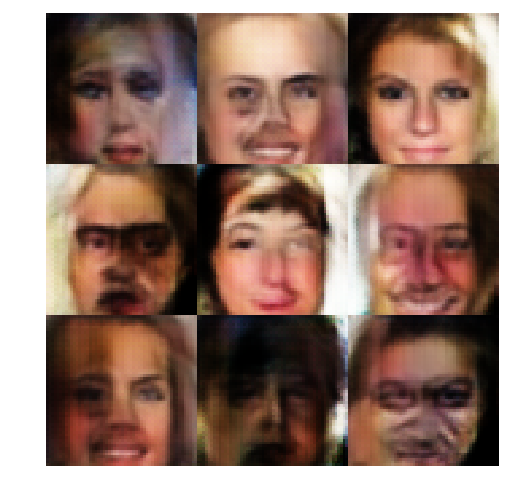

Epoch 2/10 Step 4110... Discriminator Loss: 1.1478... Generator Loss: 1.2535
Epoch 2/10 Step 4120... Discriminator Loss: 1.2183... Generator Loss: 1.1181
Epoch 2/10 Step 4130... Discriminator Loss: 1.1211... Generator Loss: 1.0270
Epoch 2/10 Step 4140... Discriminator Loss: 1.1890... Generator Loss: 0.9604
Epoch 2/10 Step 4150... Discriminator Loss: 1.1428... Generator Loss: 1.1676
Epoch 2/10 Step 4160... Discriminator Loss: 1.2692... Generator Loss: 0.6690
Epoch 2/10 Step 4170... Discriminator Loss: 1.1504... Generator Loss: 1.2108
Epoch 2/10 Step 4180... Discriminator Loss: 1.2625... Generator Loss: 0.9408
Epoch 2/10 Step 4190... Discriminator Loss: 1.2201... Generator Loss: 1.1929
Epoch 2/10 Step 4200... Discriminator Loss: 1.1180... Generator Loss: 1.1497


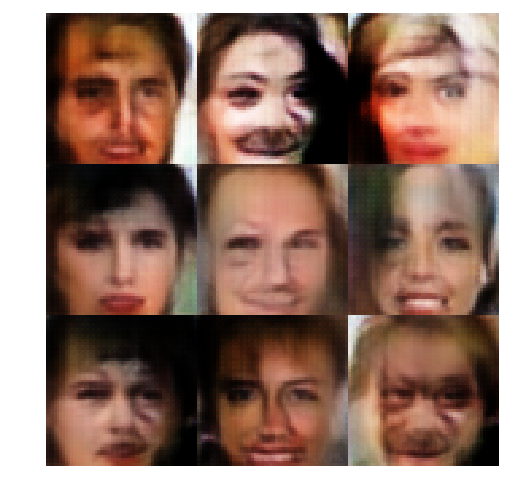

Epoch 2/10 Step 4210... Discriminator Loss: 1.1673... Generator Loss: 1.1591
Epoch 2/10 Step 4220... Discriminator Loss: 1.2884... Generator Loss: 1.6090
Epoch 2/10 Step 4230... Discriminator Loss: 1.1794... Generator Loss: 1.0071
Epoch 2/10 Step 4240... Discriminator Loss: 1.1756... Generator Loss: 0.9963
Epoch 2/10 Step 4250... Discriminator Loss: 1.4317... Generator Loss: 0.5402
Epoch 2/10 Step 4260... Discriminator Loss: 1.1579... Generator Loss: 0.9950
Epoch 2/10 Step 4270... Discriminator Loss: 1.5133... Generator Loss: 0.5568
Epoch 2/10 Step 4280... Discriminator Loss: 1.1414... Generator Loss: 1.0133
Epoch 2/10 Step 4290... Discriminator Loss: 1.2623... Generator Loss: 0.8276
Epoch 2/10 Step 4300... Discriminator Loss: 1.4644... Generator Loss: 0.5013


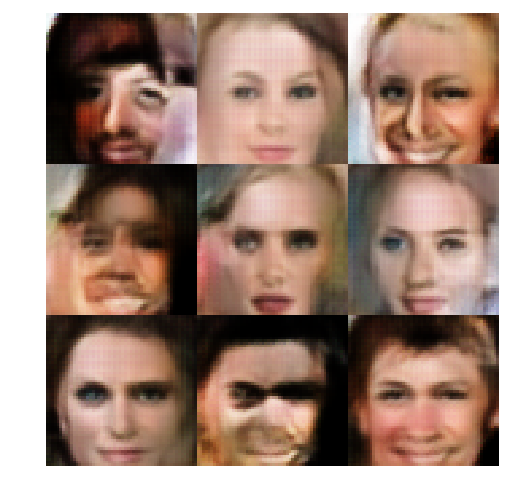

Epoch 2/10 Step 4310... Discriminator Loss: 1.2474... Generator Loss: 0.9650
Epoch 2/10 Step 4320... Discriminator Loss: 1.2237... Generator Loss: 1.1640
Epoch 2/10 Step 4330... Discriminator Loss: 1.0820... Generator Loss: 1.2618
Epoch 2/10 Step 4340... Discriminator Loss: 1.1426... Generator Loss: 0.9980
Epoch 2/10 Step 4350... Discriminator Loss: 1.1589... Generator Loss: 1.1128
Epoch 2/10 Step 4360... Discriminator Loss: 1.1693... Generator Loss: 1.2399
Epoch 2/10 Step 4370... Discriminator Loss: 1.0872... Generator Loss: 0.9915
Epoch 2/10 Step 4380... Discriminator Loss: 1.2381... Generator Loss: 0.8145
Epoch 2/10 Step 4390... Discriminator Loss: 1.0950... Generator Loss: 1.1004
Epoch 2/10 Step 4400... Discriminator Loss: 1.0799... Generator Loss: 0.9213


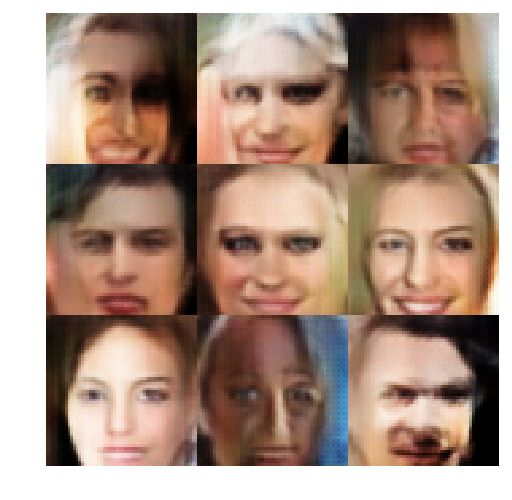

Epoch 2/10 Step 4410... Discriminator Loss: 1.3082... Generator Loss: 1.6782
Epoch 2/10 Step 4420... Discriminator Loss: 1.2015... Generator Loss: 0.8980
Epoch 2/10 Step 4430... Discriminator Loss: 1.1336... Generator Loss: 1.2683
Epoch 2/10 Step 4440... Discriminator Loss: 1.1277... Generator Loss: 1.2729
Epoch 2/10 Step 4450... Discriminator Loss: 1.1839... Generator Loss: 1.3010
Epoch 2/10 Step 4460... Discriminator Loss: 1.6126... Generator Loss: 0.4038
Epoch 2/10 Step 4470... Discriminator Loss: 1.1490... Generator Loss: 0.9158
Epoch 2/10 Step 4480... Discriminator Loss: 1.1920... Generator Loss: 1.3003
Epoch 2/10 Step 4490... Discriminator Loss: 1.2766... Generator Loss: 0.8762
Epoch 2/10 Step 4500... Discriminator Loss: 1.1820... Generator Loss: 1.0614


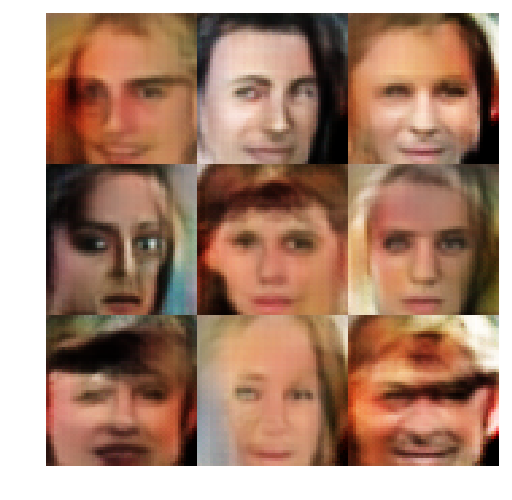

Epoch 2/10 Step 4510... Discriminator Loss: 1.0978... Generator Loss: 1.1604
Epoch 2/10 Step 4520... Discriminator Loss: 1.1505... Generator Loss: 0.8416
Epoch 2/10 Step 4530... Discriminator Loss: 1.2026... Generator Loss: 1.4603
Epoch 2/10 Step 4540... Discriminator Loss: 1.2112... Generator Loss: 0.7601
Epoch 2/10 Step 4550... Discriminator Loss: 1.1345... Generator Loss: 0.9132
Epoch 2/10 Step 4560... Discriminator Loss: 1.0913... Generator Loss: 1.2595
Epoch 2/10 Step 4570... Discriminator Loss: 1.1360... Generator Loss: 1.0042
Epoch 2/10 Step 4580... Discriminator Loss: 1.1093... Generator Loss: 0.9531
Epoch 2/10 Step 4590... Discriminator Loss: 1.2298... Generator Loss: 0.8310
Epoch 2/10 Step 4600... Discriminator Loss: 1.2382... Generator Loss: 1.2941


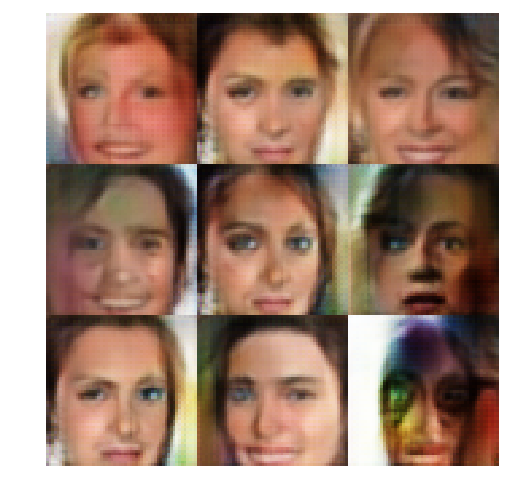

Epoch 2/10 Step 4610... Discriminator Loss: 1.3198... Generator Loss: 1.7894
Epoch 2/10 Step 4620... Discriminator Loss: 1.1816... Generator Loss: 1.0740
Epoch 2/10 Step 4630... Discriminator Loss: 1.1655... Generator Loss: 1.4120
Epoch 2/10 Step 4640... Discriminator Loss: 1.1112... Generator Loss: 1.0375
Epoch 2/10 Step 4650... Discriminator Loss: 1.0707... Generator Loss: 1.0819
Epoch 2/10 Step 4660... Discriminator Loss: 1.0854... Generator Loss: 1.2529
Epoch 2/10 Step 4670... Discriminator Loss: 1.1961... Generator Loss: 1.3771
Epoch 2/10 Step 4680... Discriminator Loss: 1.3886... Generator Loss: 0.5056
Epoch 2/10 Step 4690... Discriminator Loss: 1.6197... Generator Loss: 1.9392
Epoch 2/10 Step 4700... Discriminator Loss: 1.0701... Generator Loss: 1.2964


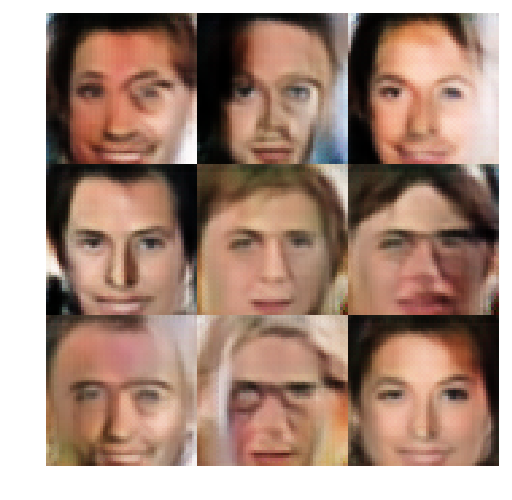

Epoch 2/10 Step 4710... Discriminator Loss: 1.1253... Generator Loss: 0.9542
Epoch 2/10 Step 4720... Discriminator Loss: 1.1397... Generator Loss: 1.0079
Epoch 2/10 Step 4730... Discriminator Loss: 1.1450... Generator Loss: 0.9768
Epoch 2/10 Step 4740... Discriminator Loss: 1.1252... Generator Loss: 1.0815
Epoch 2/10 Step 4750... Discriminator Loss: 1.0912... Generator Loss: 0.9556
Epoch 2/10 Step 4760... Discriminator Loss: 1.3927... Generator Loss: 0.5305
Epoch 2/10 Step 4770... Discriminator Loss: 1.1976... Generator Loss: 0.9019
Epoch 2/10 Step 4780... Discriminator Loss: 1.1977... Generator Loss: 1.3373
Epoch 2/10 Step 4790... Discriminator Loss: 1.1266... Generator Loss: 1.1342
Epoch 2/10 Step 4800... Discriminator Loss: 1.1412... Generator Loss: 0.9902


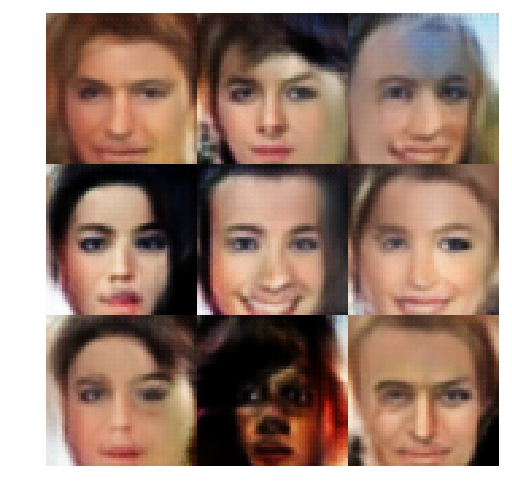

Epoch 2/10 Step 4810... Discriminator Loss: 1.3133... Generator Loss: 0.5979
Epoch 2/10 Step 4820... Discriminator Loss: 1.0174... Generator Loss: 1.1434
Epoch 2/10 Step 4830... Discriminator Loss: 1.5894... Generator Loss: 0.4583
Epoch 2/10 Step 4840... Discriminator Loss: 1.1405... Generator Loss: 1.0338
Epoch 2/10 Step 4850... Discriminator Loss: 1.1836... Generator Loss: 0.9238
Epoch 2/10 Step 4860... Discriminator Loss: 1.3019... Generator Loss: 0.6892
Epoch 2/10 Step 4870... Discriminator Loss: 1.0816... Generator Loss: 1.0102
Epoch 2/10 Step 4880... Discriminator Loss: 1.1555... Generator Loss: 1.3758
Epoch 2/10 Step 4890... Discriminator Loss: 1.4502... Generator Loss: 1.7066
Epoch 2/10 Step 4900... Discriminator Loss: 1.2218... Generator Loss: 0.8012


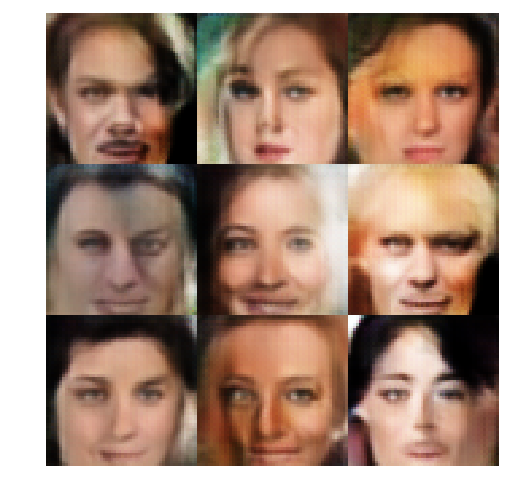

Epoch 2/10 Step 4910... Discriminator Loss: 1.1206... Generator Loss: 1.0232
Epoch 2/10 Step 4920... Discriminator Loss: 1.1542... Generator Loss: 1.3107
Epoch 2/10 Step 4930... Discriminator Loss: 1.1064... Generator Loss: 1.1126
Epoch 2/10 Step 4940... Discriminator Loss: 1.2986... Generator Loss: 1.9411
Epoch 2/10 Step 4950... Discriminator Loss: 1.0954... Generator Loss: 1.0050
Epoch 2/10 Step 4960... Discriminator Loss: 1.7157... Generator Loss: 2.4348
Epoch 2/10 Step 4970... Discriminator Loss: 1.2490... Generator Loss: 0.6752
Epoch 2/10 Step 4980... Discriminator Loss: 1.4552... Generator Loss: 1.4862
Epoch 2/10 Step 4990... Discriminator Loss: 1.2579... Generator Loss: 0.8672
Epoch 2/10 Step 5000... Discriminator Loss: 1.2376... Generator Loss: 0.9321


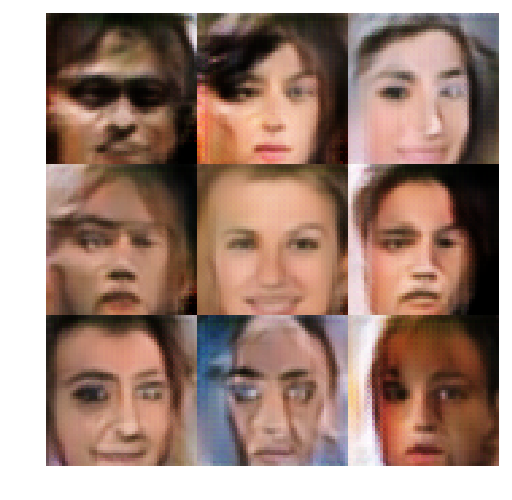

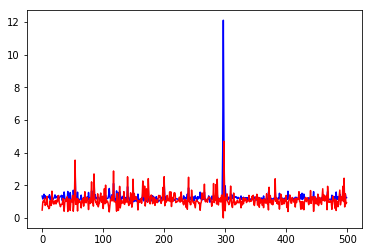

Epoch 2/10 Step 5010... Discriminator Loss: 1.1838... Generator Loss: 1.1124
Epoch 2/10 Step 5020... Discriminator Loss: 1.2372... Generator Loss: 1.0784
Epoch 2/10 Step 5030... Discriminator Loss: 1.1855... Generator Loss: 0.9615
Epoch 2/10 Step 5040... Discriminator Loss: 1.2097... Generator Loss: 1.1166
Epoch 2/10 Step 5050... Discriminator Loss: 1.2114... Generator Loss: 0.9815
Epoch 2/10 Step 5060... Discriminator Loss: 1.1748... Generator Loss: 0.9634
Epoch 2/10 Step 5070... Discriminator Loss: 1.0929... Generator Loss: 1.2113
Epoch 2/10 Step 5080... Discriminator Loss: 1.1627... Generator Loss: 0.9168
Epoch 2/10 Step 5090... Discriminator Loss: 1.2096... Generator Loss: 0.9134
Epoch 2/10 Step 5100... Discriminator Loss: 1.1156... Generator Loss: 1.2248


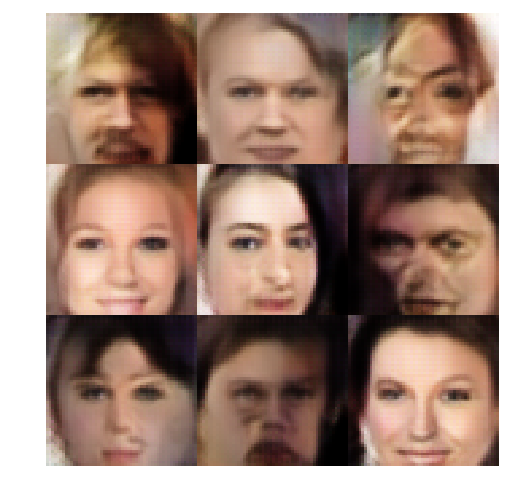

Epoch 2/10 Step 5110... Discriminator Loss: 1.1203... Generator Loss: 1.1933
Epoch 2/10 Step 5120... Discriminator Loss: 1.1468... Generator Loss: 1.0078
Epoch 2/10 Step 5130... Discriminator Loss: 1.1090... Generator Loss: 0.8813
Epoch 2/10 Step 5140... Discriminator Loss: 1.0852... Generator Loss: 1.2005
Epoch 2/10 Step 5150... Discriminator Loss: 1.1345... Generator Loss: 1.2740
Epoch 2/10 Step 5160... Discriminator Loss: 1.1572... Generator Loss: 1.0862
Epoch 2/10 Step 5170... Discriminator Loss: 1.1836... Generator Loss: 1.3738
Epoch 2/10 Step 5180... Discriminator Loss: 1.1532... Generator Loss: 0.9198
Epoch 2/10 Step 5190... Discriminator Loss: 1.2177... Generator Loss: 1.1384
Epoch 2/10 Step 5200... Discriminator Loss: 1.0844... Generator Loss: 1.2766


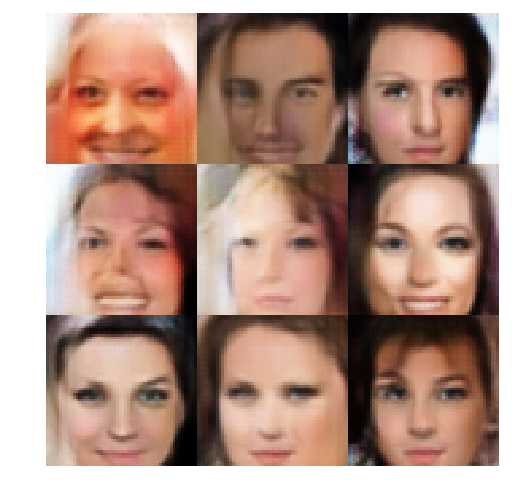

Epoch 2/10 Step 5210... Discriminator Loss: 1.1092... Generator Loss: 1.1669
Epoch 2/10 Step 5220... Discriminator Loss: 1.1584... Generator Loss: 0.9513
Epoch 2/10 Step 5230... Discriminator Loss: 1.1381... Generator Loss: 1.1079
Epoch 2/10 Step 5240... Discriminator Loss: 1.2146... Generator Loss: 1.1583
Epoch 2/10 Step 5250... Discriminator Loss: 1.0740... Generator Loss: 1.0060
Epoch 2/10 Step 5260... Discriminator Loss: 1.0708... Generator Loss: 1.3330
Epoch 2/10 Step 5270... Discriminator Loss: 1.0448... Generator Loss: 1.6459
Epoch 2/10 Step 5280... Discriminator Loss: 1.1770... Generator Loss: 1.2555
Epoch 2/10 Step 5290... Discriminator Loss: 1.3417... Generator Loss: 0.6253
Epoch 2/10 Step 5300... Discriminator Loss: 1.1681... Generator Loss: 0.8392


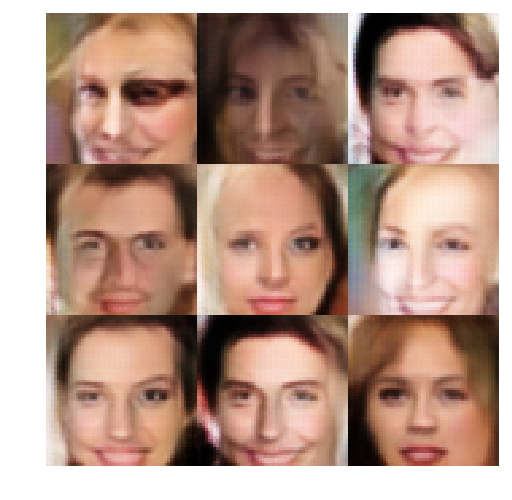

Epoch 2/10 Step 5310... Discriminator Loss: 1.2174... Generator Loss: 0.6924
Epoch 2/10 Step 5320... Discriminator Loss: 1.1995... Generator Loss: 0.9009
Epoch 2/10 Step 5330... Discriminator Loss: 1.1074... Generator Loss: 1.3247
Epoch 2/10 Step 5340... Discriminator Loss: 1.1588... Generator Loss: 1.0842
Epoch 2/10 Step 5350... Discriminator Loss: 1.5085... Generator Loss: 0.5905
Epoch 2/10 Step 5360... Discriminator Loss: 1.1944... Generator Loss: 1.0365
Epoch 2/10 Step 5370... Discriminator Loss: 1.1320... Generator Loss: 1.0198
Epoch 2/10 Step 5380... Discriminator Loss: 1.0566... Generator Loss: 1.1181
Epoch 2/10 Step 5390... Discriminator Loss: 1.0839... Generator Loss: 1.1882
Epoch 2/10 Step 5400... Discriminator Loss: 3.4961... Generator Loss: 3.9425


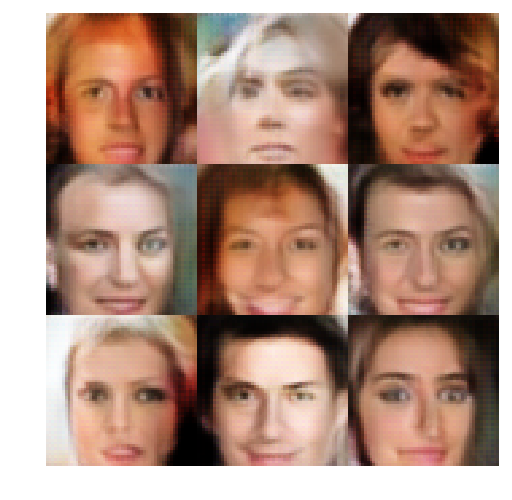

Epoch 2/10 Step 5410... Discriminator Loss: 1.2583... Generator Loss: 0.8798
Epoch 2/10 Step 5420... Discriminator Loss: 1.3124... Generator Loss: 0.8875
Epoch 2/10 Step 5430... Discriminator Loss: 1.2662... Generator Loss: 0.8541
Epoch 2/10 Step 5440... Discriminator Loss: 1.1667... Generator Loss: 1.0049
Epoch 2/10 Step 5450... Discriminator Loss: 1.2119... Generator Loss: 1.1733
Epoch 2/10 Step 5460... Discriminator Loss: 1.2786... Generator Loss: 0.9493
Epoch 2/10 Step 5470... Discriminator Loss: 1.2174... Generator Loss: 0.9059
Epoch 2/10 Step 5480... Discriminator Loss: 1.1984... Generator Loss: 0.9349
Epoch 2/10 Step 5490... Discriminator Loss: 1.1628... Generator Loss: 0.8873
Epoch 2/10 Step 5500... Discriminator Loss: 1.1502... Generator Loss: 1.0011


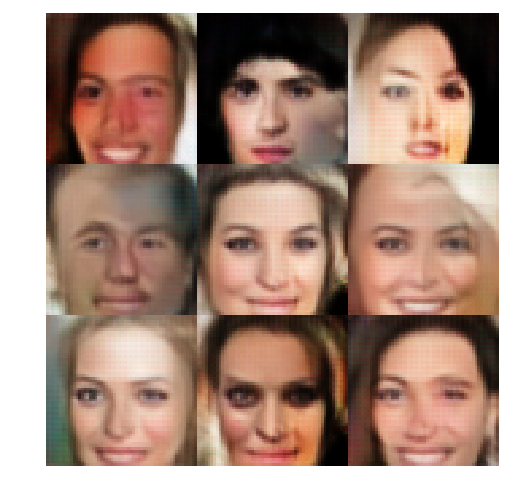

Epoch 2/10 Step 5510... Discriminator Loss: 1.1957... Generator Loss: 1.0487
Epoch 2/10 Step 5520... Discriminator Loss: 1.1013... Generator Loss: 0.9917
Epoch 2/10 Step 5530... Discriminator Loss: 1.2505... Generator Loss: 0.8570
Epoch 2/10 Step 5540... Discriminator Loss: 1.1453... Generator Loss: 1.0810
Epoch 2/10 Step 5550... Discriminator Loss: 1.1867... Generator Loss: 1.2129
Epoch 2/10 Step 5560... Discriminator Loss: 1.1660... Generator Loss: 0.9707
Epoch 2/10 Step 5570... Discriminator Loss: 1.1649... Generator Loss: 0.9755
Epoch 2/10 Step 5580... Discriminator Loss: 1.1354... Generator Loss: 1.0958
Epoch 2/10 Step 5590... Discriminator Loss: 1.2782... Generator Loss: 1.5239
Epoch 2/10 Step 5600... Discriminator Loss: 1.0732... Generator Loss: 1.3140


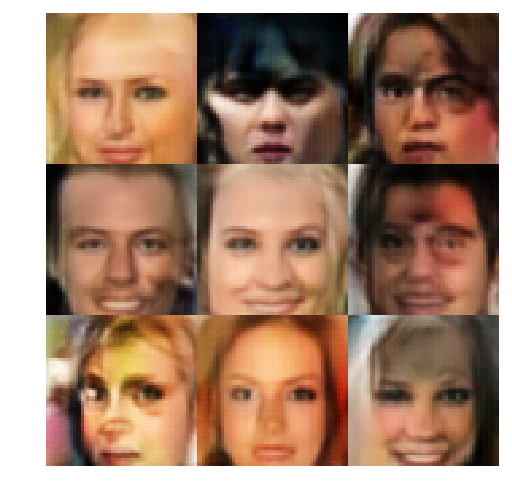

Epoch 2/10 Step 5610... Discriminator Loss: 1.1978... Generator Loss: 1.1264
Epoch 2/10 Step 5620... Discriminator Loss: 1.0524... Generator Loss: 1.2076
Epoch 2/10 Step 5630... Discriminator Loss: 1.1806... Generator Loss: 1.4653
Epoch 2/10 Step 5640... Discriminator Loss: 1.1251... Generator Loss: 0.7781
Epoch 2/10 Step 5650... Discriminator Loss: 1.1813... Generator Loss: 0.9702
Epoch 2/10 Step 5660... Discriminator Loss: 1.1158... Generator Loss: 0.9053
Epoch 2/10 Step 5670... Discriminator Loss: 1.1303... Generator Loss: 1.1798
Epoch 2/10 Step 5680... Discriminator Loss: 1.2796... Generator Loss: 0.6275
Epoch 2/10 Step 5690... Discriminator Loss: 1.0897... Generator Loss: 1.0150
Epoch 2/10 Step 5700... Discriminator Loss: 1.4742... Generator Loss: 0.5294


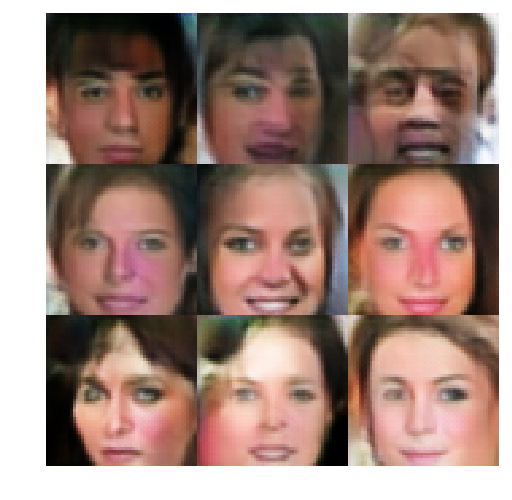

Epoch 2/10 Step 5710... Discriminator Loss: 1.1801... Generator Loss: 1.0010
Epoch 2/10 Step 5720... Discriminator Loss: 1.0986... Generator Loss: 1.1796
Epoch 2/10 Step 5730... Discriminator Loss: 1.1155... Generator Loss: 0.8648
Epoch 2/10 Step 5740... Discriminator Loss: 1.1190... Generator Loss: 1.1660
Epoch 2/10 Step 5750... Discriminator Loss: 1.1315... Generator Loss: 1.1613
Epoch 2/10 Step 5760... Discriminator Loss: 1.0643... Generator Loss: 1.0970
Epoch 2/10 Step 5770... Discriminator Loss: 1.0523... Generator Loss: 1.2056
Epoch 2/10 Step 5780... Discriminator Loss: 1.2644... Generator Loss: 1.3296
Epoch 2/10 Step 5790... Discriminator Loss: 1.1387... Generator Loss: 1.1611
Epoch 2/10 Step 5800... Discriminator Loss: 1.1498... Generator Loss: 0.8117


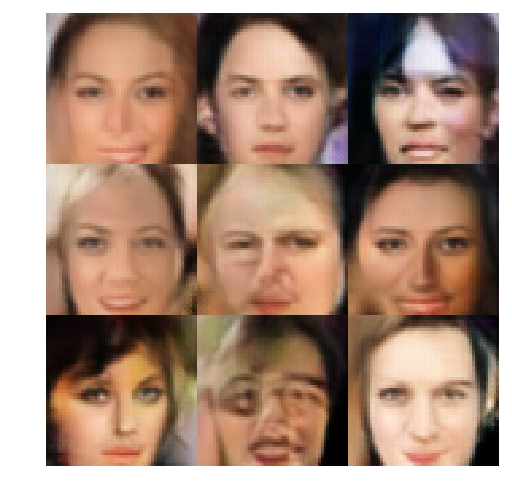

Epoch 2/10 Step 5810... Discriminator Loss: 1.0568... Generator Loss: 1.2005
Epoch 2/10 Step 5820... Discriminator Loss: 1.1312... Generator Loss: 1.0188
Epoch 2/10 Step 5830... Discriminator Loss: 1.0801... Generator Loss: 1.2151
Epoch 2/10 Step 5840... Discriminator Loss: 1.1702... Generator Loss: 1.4745
Epoch 2/10 Step 5850... Discriminator Loss: 1.7509... Generator Loss: 1.7665
Epoch 2/10 Step 5860... Discriminator Loss: 381.3551... Generator Loss: 0.0000
Epoch 2/10 Step 5870... Discriminator Loss: 5.2870... Generator Loss: 16.5216
Epoch 2/10 Step 5880... Discriminator Loss: 2.0521... Generator Loss: 3.8479
Epoch 2/10 Step 5890... Discriminator Loss: 1.1321... Generator Loss: 1.4545
Epoch 2/10 Step 5900... Discriminator Loss: 2.2267... Generator Loss: 4.8632


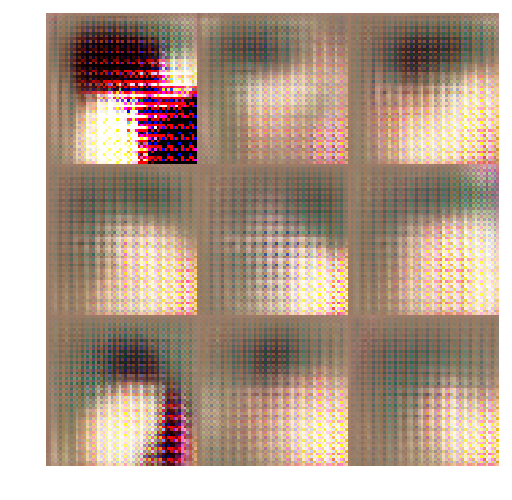

Epoch 2/10 Step 5910... Discriminator Loss: 0.7258... Generator Loss: 3.1486
Epoch 2/10 Step 5920... Discriminator Loss: 0.9312... Generator Loss: 1.3547
Epoch 2/10 Step 5930... Discriminator Loss: 1.0439... Generator Loss: 1.0398
Epoch 2/10 Step 5940... Discriminator Loss: 0.9145... Generator Loss: 1.5000
Epoch 2/10 Step 5950... Discriminator Loss: 1.0585... Generator Loss: 1.0086
Epoch 2/10 Step 5960... Discriminator Loss: 1.3550... Generator Loss: 0.6451
Epoch 2/10 Step 5970... Discriminator Loss: 1.6888... Generator Loss: 0.4909
Epoch 2/10 Step 5980... Discriminator Loss: 1.2047... Generator Loss: 0.8506
Epoch 2/10 Step 5990... Discriminator Loss: 1.2642... Generator Loss: 1.0801
Epoch 2/10 Step 6000... Discriminator Loss: 1.2446... Generator Loss: 1.0005


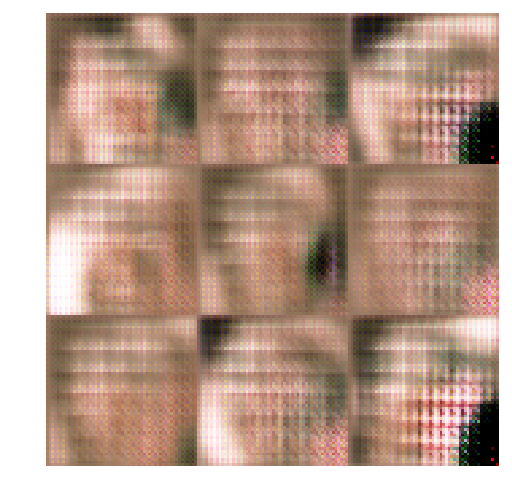

Epoch 2/10 Step 6010... Discriminator Loss: 1.2202... Generator Loss: 0.8462
Epoch 2/10 Step 6020... Discriminator Loss: 1.2271... Generator Loss: 1.0259
Epoch 2/10 Step 6030... Discriminator Loss: 1.4663... Generator Loss: 1.7512
Epoch 2/10 Step 6040... Discriminator Loss: 1.2840... Generator Loss: 0.8768
Epoch 2/10 Step 6050... Discriminator Loss: 1.1881... Generator Loss: 0.7430
Epoch 2/10 Step 6060... Discriminator Loss: 1.1522... Generator Loss: 0.8003
Epoch 2/10 Step 6070... Discriminator Loss: 1.1864... Generator Loss: 1.1279
Epoch 2/10 Step 6080... Discriminator Loss: 1.3578... Generator Loss: 1.6474
Epoch 2/10 Step 6090... Discriminator Loss: 1.1551... Generator Loss: 0.8394
Epoch 2/10 Step 6100... Discriminator Loss: 1.0946... Generator Loss: 1.0586


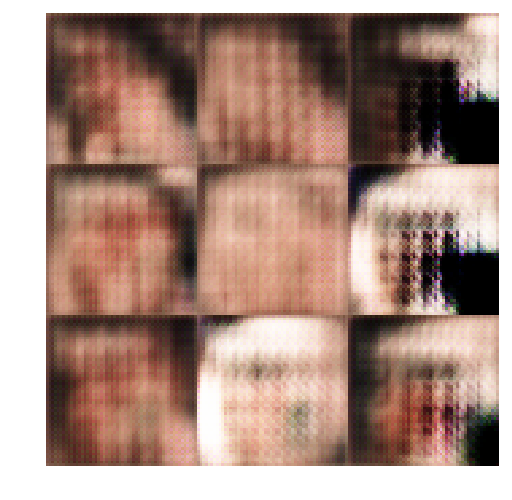

Epoch 2/10 Step 6110... Discriminator Loss: 1.2043... Generator Loss: 0.7062
Epoch 2/10 Step 6120... Discriminator Loss: 1.1788... Generator Loss: 0.9421
Epoch 2/10 Step 6130... Discriminator Loss: 1.2443... Generator Loss: 0.8073
Epoch 2/10 Step 6140... Discriminator Loss: 1.1939... Generator Loss: 1.0042
Epoch 2/10 Step 6150... Discriminator Loss: 1.1738... Generator Loss: 0.8331
Epoch 2/10 Step 6160... Discriminator Loss: 1.1879... Generator Loss: 0.8055
Epoch 2/10 Step 6170... Discriminator Loss: 1.2335... Generator Loss: 0.6364
Epoch 2/10 Step 6180... Discriminator Loss: 1.2157... Generator Loss: 1.4611
Epoch 2/10 Step 6190... Discriminator Loss: 1.1228... Generator Loss: 1.0152
Epoch 2/10 Step 6200... Discriminator Loss: 1.1435... Generator Loss: 1.3161


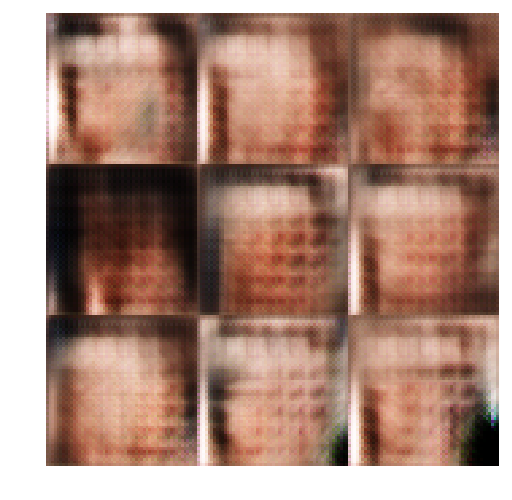

Epoch 2/10 Step 6210... Discriminator Loss: 1.0647... Generator Loss: 0.9922
Epoch 2/10 Step 6220... Discriminator Loss: 1.1383... Generator Loss: 1.1883
Epoch 2/10 Step 6230... Discriminator Loss: 1.1308... Generator Loss: 0.8601
Epoch 2/10 Step 6240... Discriminator Loss: 1.1075... Generator Loss: 1.1276
Epoch 2/10 Step 6250... Discriminator Loss: 1.2353... Generator Loss: 1.6379
Epoch 2/10 Step 6260... Discriminator Loss: 1.1625... Generator Loss: 0.8411
Epoch 2/10 Step 6270... Discriminator Loss: 1.0647... Generator Loss: 1.0529
Epoch 2/10 Step 6280... Discriminator Loss: 1.1192... Generator Loss: 1.1493
Epoch 2/10 Step 6290... Discriminator Loss: 1.2264... Generator Loss: 0.6902
Epoch 2/10 Step 6300... Discriminator Loss: 1.1271... Generator Loss: 1.1522


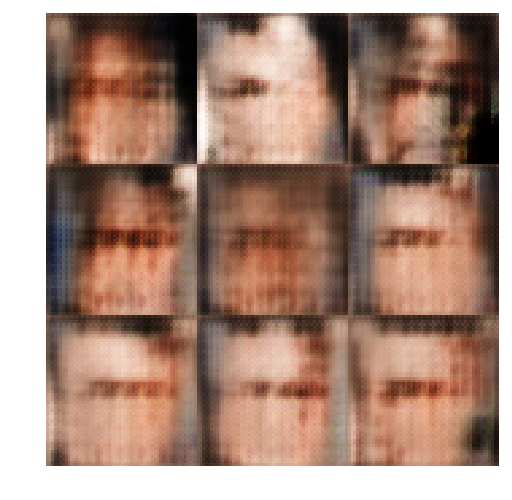

Epoch 2/10 Step 6310... Discriminator Loss: 1.2615... Generator Loss: 1.6841
Epoch 2/10 Step 6320... Discriminator Loss: 1.0837... Generator Loss: 1.2848
Epoch 2/10 Step 6330... Discriminator Loss: 1.1507... Generator Loss: 1.0651
Epoch 3/10 Step 6340... Discriminator Loss: 1.0901... Generator Loss: 1.0133
Epoch 3/10 Step 6350... Discriminator Loss: 1.0962... Generator Loss: 1.4840
Epoch 3/10 Step 6360... Discriminator Loss: 1.1136... Generator Loss: 1.1126
Epoch 3/10 Step 6370... Discriminator Loss: 1.4028... Generator Loss: 0.9986
Epoch 3/10 Step 6380... Discriminator Loss: 1.1279... Generator Loss: 1.0117
Epoch 3/10 Step 6390... Discriminator Loss: 1.1506... Generator Loss: 1.1447
Epoch 3/10 Step 6400... Discriminator Loss: 1.1299... Generator Loss: 0.8078


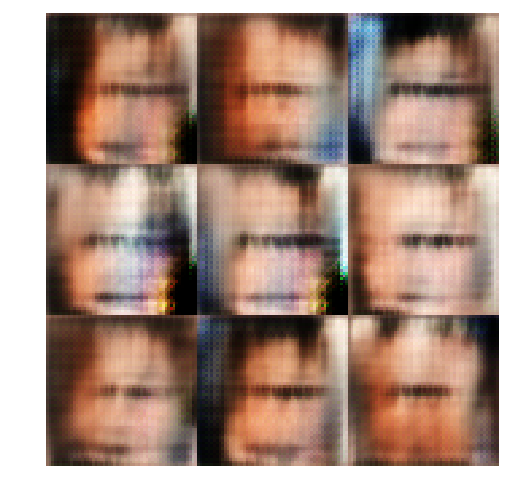

Epoch 3/10 Step 6410... Discriminator Loss: 1.1638... Generator Loss: 0.8040
Epoch 3/10 Step 6420... Discriminator Loss: 1.2640... Generator Loss: 1.5598
Epoch 3/10 Step 6430... Discriminator Loss: 1.1917... Generator Loss: 0.8135
Epoch 3/10 Step 6440... Discriminator Loss: 1.3106... Generator Loss: 1.7656
Epoch 3/10 Step 6450... Discriminator Loss: 1.2322... Generator Loss: 1.0702
Epoch 3/10 Step 6460... Discriminator Loss: 1.4388... Generator Loss: 1.8654
Epoch 3/10 Step 6470... Discriminator Loss: 1.1284... Generator Loss: 1.0045
Epoch 3/10 Step 6480... Discriminator Loss: 1.1448... Generator Loss: 1.3798
Epoch 3/10 Step 6490... Discriminator Loss: 1.1359... Generator Loss: 1.0727
Epoch 3/10 Step 6500... Discriminator Loss: 1.2863... Generator Loss: 1.8445


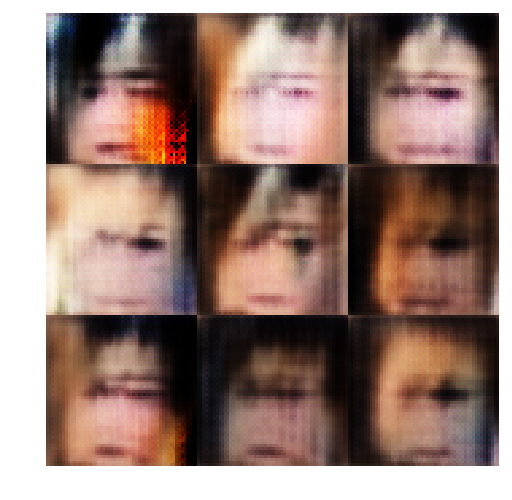

Epoch 3/10 Step 6510... Discriminator Loss: 2.0029... Generator Loss: 2.8397
Epoch 3/10 Step 6520... Discriminator Loss: 1.1044... Generator Loss: 1.3871
Epoch 3/10 Step 6530... Discriminator Loss: 1.0711... Generator Loss: 1.3837
Epoch 3/10 Step 6540... Discriminator Loss: 1.0393... Generator Loss: 1.2971
Epoch 3/10 Step 6550... Discriminator Loss: 1.0958... Generator Loss: 1.0455
Epoch 3/10 Step 6560... Discriminator Loss: 1.1270... Generator Loss: 1.3510
Epoch 3/10 Step 6570... Discriminator Loss: 1.2072... Generator Loss: 1.4532
Epoch 3/10 Step 6580... Discriminator Loss: 1.1583... Generator Loss: 1.6964
Epoch 3/10 Step 6590... Discriminator Loss: 1.1026... Generator Loss: 0.9073
Epoch 3/10 Step 6600... Discriminator Loss: 1.0751... Generator Loss: 1.1543


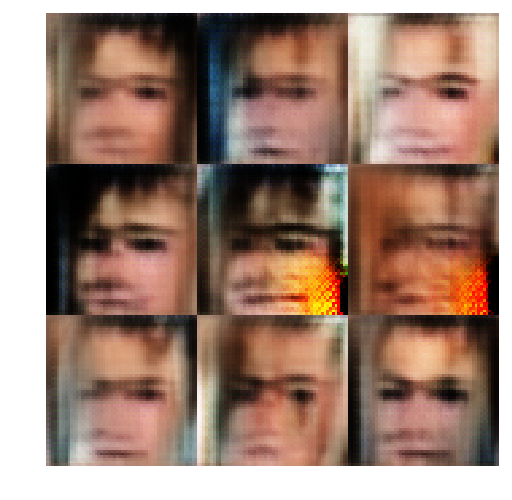

Epoch 3/10 Step 6610... Discriminator Loss: 1.0458... Generator Loss: 1.1546
Epoch 3/10 Step 6620... Discriminator Loss: 1.0673... Generator Loss: 1.0389
Epoch 3/10 Step 6630... Discriminator Loss: 1.1507... Generator Loss: 0.9084
Epoch 3/10 Step 6640... Discriminator Loss: 1.1543... Generator Loss: 1.0109
Epoch 3/10 Step 6650... Discriminator Loss: 1.1824... Generator Loss: 1.3740
Epoch 3/10 Step 6660... Discriminator Loss: 1.1176... Generator Loss: 1.1691
Epoch 3/10 Step 6670... Discriminator Loss: 1.1202... Generator Loss: 1.1825
Epoch 3/10 Step 6680... Discriminator Loss: 1.0489... Generator Loss: 0.9580
Epoch 3/10 Step 6690... Discriminator Loss: 1.0177... Generator Loss: 1.0768
Epoch 3/10 Step 6700... Discriminator Loss: 1.5180... Generator Loss: 2.2819


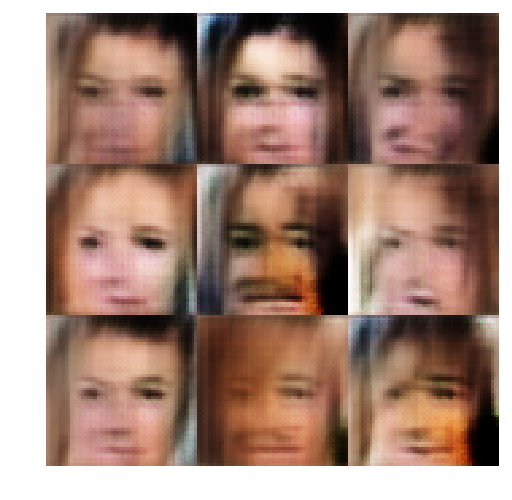

Epoch 3/10 Step 6710... Discriminator Loss: 1.0561... Generator Loss: 0.9592
Epoch 3/10 Step 6720... Discriminator Loss: 1.1607... Generator Loss: 0.8273
Epoch 3/10 Step 6730... Discriminator Loss: 1.0597... Generator Loss: 1.0409
Epoch 3/10 Step 6740... Discriminator Loss: 1.1465... Generator Loss: 0.8539
Epoch 3/10 Step 6750... Discriminator Loss: 1.2093... Generator Loss: 1.3890
Epoch 3/10 Step 6760... Discriminator Loss: 1.3575... Generator Loss: 1.9140
Epoch 3/10 Step 6770... Discriminator Loss: 1.0484... Generator Loss: 1.3125
Epoch 3/10 Step 6780... Discriminator Loss: 1.0711... Generator Loss: 1.1395
Epoch 3/10 Step 6790... Discriminator Loss: 1.1462... Generator Loss: 0.8704
Epoch 3/10 Step 6800... Discriminator Loss: 1.0749... Generator Loss: 0.9105


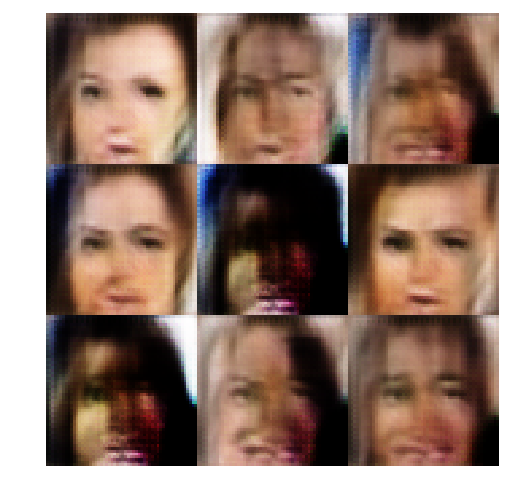

Epoch 3/10 Step 6810... Discriminator Loss: 1.0651... Generator Loss: 1.4702
Epoch 3/10 Step 6820... Discriminator Loss: 1.0715... Generator Loss: 0.9929
Epoch 3/10 Step 6830... Discriminator Loss: 1.0891... Generator Loss: 1.1203
Epoch 3/10 Step 6840... Discriminator Loss: 1.0761... Generator Loss: 1.0003
Epoch 3/10 Step 6850... Discriminator Loss: 1.6800... Generator Loss: 2.3346
Epoch 3/10 Step 6860... Discriminator Loss: 1.0649... Generator Loss: 1.1247
Epoch 3/10 Step 6870... Discriminator Loss: 1.0826... Generator Loss: 0.8734
Epoch 3/10 Step 6880... Discriminator Loss: 1.0985... Generator Loss: 1.5163
Epoch 3/10 Step 6890... Discriminator Loss: 1.1292... Generator Loss: 0.9320
Epoch 3/10 Step 6900... Discriminator Loss: 1.6694... Generator Loss: 2.3587


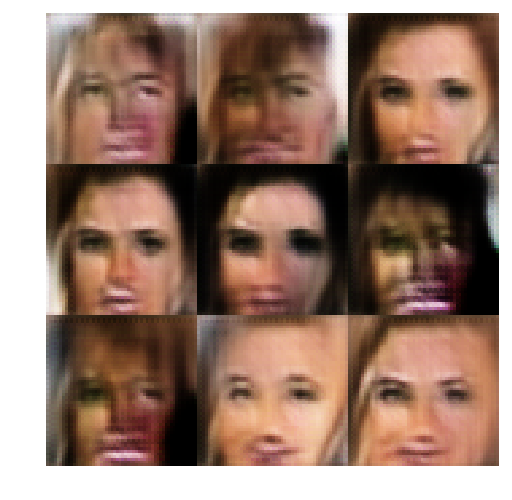

Epoch 3/10 Step 6910... Discriminator Loss: 1.0086... Generator Loss: 1.2075
Epoch 3/10 Step 6920... Discriminator Loss: 1.0950... Generator Loss: 0.9120
Epoch 3/10 Step 6930... Discriminator Loss: 1.0779... Generator Loss: 1.1233
Epoch 3/10 Step 6940... Discriminator Loss: 1.0610... Generator Loss: 1.0570
Epoch 3/10 Step 6950... Discriminator Loss: 1.0695... Generator Loss: 1.1065
Epoch 3/10 Step 6960... Discriminator Loss: 1.2808... Generator Loss: 1.9716
Epoch 3/10 Step 6970... Discriminator Loss: 1.1703... Generator Loss: 2.0904
Epoch 3/10 Step 6980... Discriminator Loss: 1.0526... Generator Loss: 0.9925
Epoch 3/10 Step 6990... Discriminator Loss: 1.0657... Generator Loss: 1.0346
Epoch 3/10 Step 7000... Discriminator Loss: 1.2214... Generator Loss: 1.7511


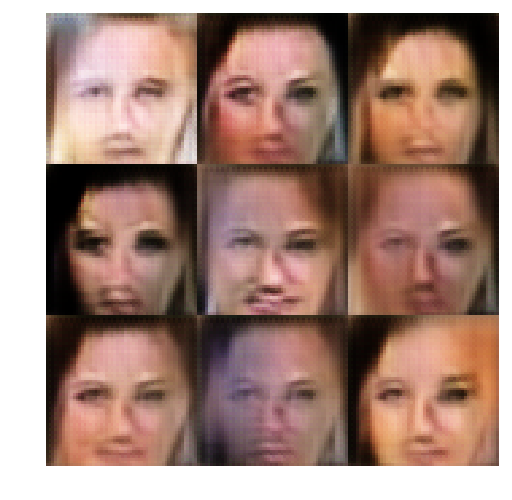

Epoch 3/10 Step 7010... Discriminator Loss: 1.0323... Generator Loss: 1.0709
Epoch 3/10 Step 7020... Discriminator Loss: 1.0732... Generator Loss: 0.9136
Epoch 3/10 Step 7030... Discriminator Loss: 1.0986... Generator Loss: 1.3122
Epoch 3/10 Step 7040... Discriminator Loss: 1.0480... Generator Loss: 1.3057
Epoch 3/10 Step 7050... Discriminator Loss: 1.0212... Generator Loss: 0.9801
Epoch 3/10 Step 7060... Discriminator Loss: 1.0314... Generator Loss: 1.1526
Epoch 3/10 Step 7070... Discriminator Loss: 1.0099... Generator Loss: 1.2445
Epoch 3/10 Step 7080... Discriminator Loss: 0.9850... Generator Loss: 1.1602
Epoch 3/10 Step 7090... Discriminator Loss: 1.0808... Generator Loss: 1.0093
Epoch 3/10 Step 7100... Discriminator Loss: 1.0334... Generator Loss: 0.9446


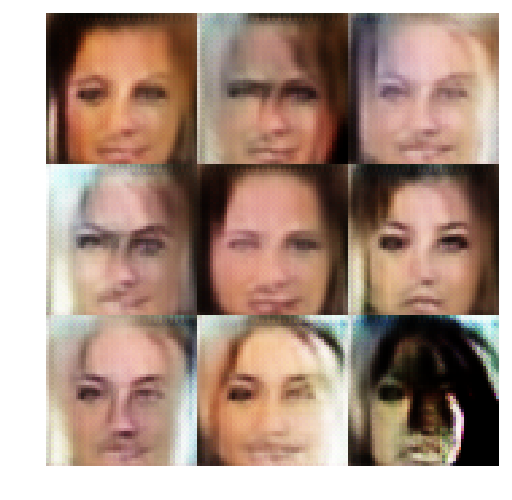

Epoch 3/10 Step 7110... Discriminator Loss: 1.1030... Generator Loss: 0.9396
Epoch 3/10 Step 7120... Discriminator Loss: 1.0976... Generator Loss: 1.1531
Epoch 3/10 Step 7130... Discriminator Loss: 1.0823... Generator Loss: 0.9286
Epoch 3/10 Step 7140... Discriminator Loss: 1.0716... Generator Loss: 1.4914
Epoch 3/10 Step 7150... Discriminator Loss: 1.3638... Generator Loss: 2.0778
Epoch 3/10 Step 7160... Discriminator Loss: 1.2232... Generator Loss: 1.8654
Epoch 3/10 Step 7170... Discriminator Loss: 0.9987... Generator Loss: 1.6989
Epoch 3/10 Step 7180... Discriminator Loss: 0.9865... Generator Loss: 1.0640
Epoch 3/10 Step 7190... Discriminator Loss: 1.0208... Generator Loss: 1.1928
Epoch 3/10 Step 7200... Discriminator Loss: 1.1129... Generator Loss: 1.3198


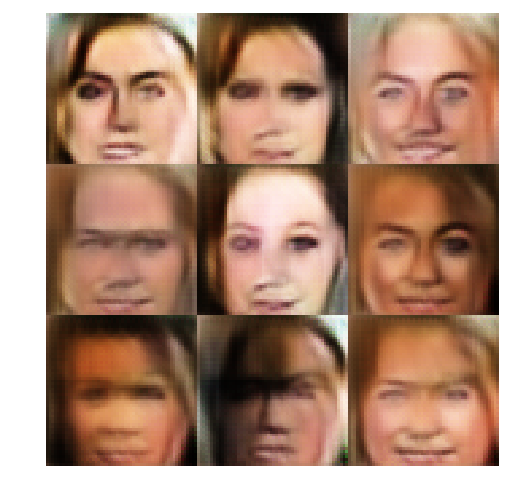

Epoch 3/10 Step 7210... Discriminator Loss: 1.0909... Generator Loss: 1.6703
Epoch 3/10 Step 7220... Discriminator Loss: 1.0104... Generator Loss: 0.9110
Epoch 3/10 Step 7230... Discriminator Loss: 1.1361... Generator Loss: 1.6257
Epoch 3/10 Step 7240... Discriminator Loss: 0.9899... Generator Loss: 1.4323
Epoch 3/10 Step 7250... Discriminator Loss: 1.1089... Generator Loss: 0.9649
Epoch 3/10 Step 7260... Discriminator Loss: 1.0632... Generator Loss: 1.1076
Epoch 3/10 Step 7270... Discriminator Loss: 1.0330... Generator Loss: 1.0019
Epoch 3/10 Step 7280... Discriminator Loss: 1.0363... Generator Loss: 1.5246
Epoch 3/10 Step 7290... Discriminator Loss: 1.0589... Generator Loss: 1.7411
Epoch 3/10 Step 7300... Discriminator Loss: 1.0000... Generator Loss: 1.2287


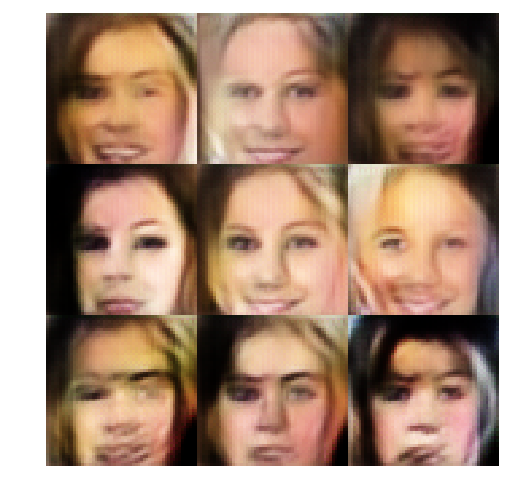

Epoch 3/10 Step 7310... Discriminator Loss: 1.0898... Generator Loss: 0.9542
Epoch 3/10 Step 7320... Discriminator Loss: 1.1159... Generator Loss: 1.6386
Epoch 3/10 Step 7330... Discriminator Loss: 0.9520... Generator Loss: 1.1833
Epoch 3/10 Step 7340... Discriminator Loss: 1.1699... Generator Loss: 0.8226
Epoch 3/10 Step 7350... Discriminator Loss: 0.9478... Generator Loss: 1.1777
Epoch 3/10 Step 7360... Discriminator Loss: 1.2103... Generator Loss: 1.9050
Epoch 3/10 Step 7370... Discriminator Loss: 1.0261... Generator Loss: 1.2086
Epoch 3/10 Step 7380... Discriminator Loss: 1.1109... Generator Loss: 1.1669
Epoch 3/10 Step 7390... Discriminator Loss: 1.0314... Generator Loss: 1.2705
Epoch 3/10 Step 7400... Discriminator Loss: 1.0378... Generator Loss: 1.1526


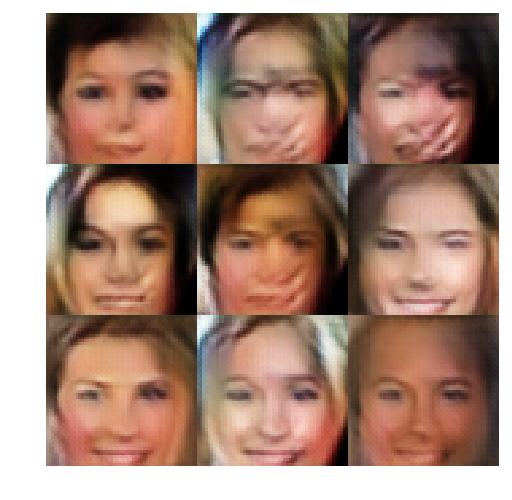

Epoch 3/10 Step 7410... Discriminator Loss: 1.2377... Generator Loss: 1.2050
Epoch 3/10 Step 7420... Discriminator Loss: 1.0721... Generator Loss: 1.3498
Epoch 3/10 Step 7430... Discriminator Loss: 1.0301... Generator Loss: 1.1314
Epoch 3/10 Step 7440... Discriminator Loss: 1.0453... Generator Loss: 1.0023
Epoch 3/10 Step 7450... Discriminator Loss: 1.0430... Generator Loss: 1.0676
Epoch 3/10 Step 7460... Discriminator Loss: 0.9655... Generator Loss: 1.1888
Epoch 3/10 Step 7470... Discriminator Loss: 1.0717... Generator Loss: 1.5690
Epoch 3/10 Step 7480... Discriminator Loss: 0.9956... Generator Loss: 1.1190
Epoch 3/10 Step 7490... Discriminator Loss: 1.0490... Generator Loss: 0.9409
Epoch 3/10 Step 7500... Discriminator Loss: 1.0932... Generator Loss: 0.8545


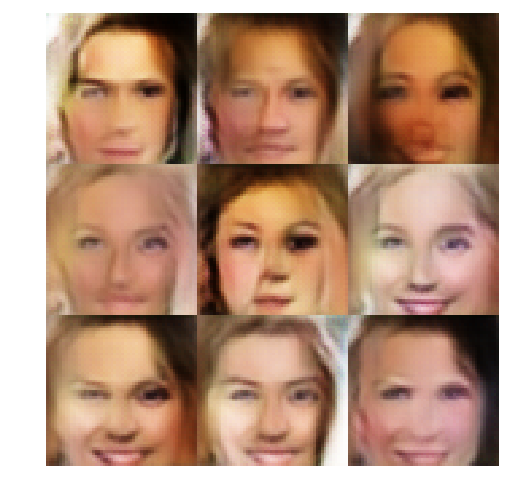

Epoch 3/10 Step 7510... Discriminator Loss: 1.0030... Generator Loss: 1.0999
Epoch 3/10 Step 7520... Discriminator Loss: 1.0050... Generator Loss: 1.6319
Epoch 3/10 Step 7530... Discriminator Loss: 1.0984... Generator Loss: 1.5366
Epoch 3/10 Step 7540... Discriminator Loss: 1.6690... Generator Loss: 1.7028
Epoch 3/10 Step 7550... Discriminator Loss: 0.9605... Generator Loss: 1.2261
Epoch 3/10 Step 7560... Discriminator Loss: 0.9554... Generator Loss: 1.3404
Epoch 3/10 Step 7570... Discriminator Loss: 0.9701... Generator Loss: 1.1343
Epoch 3/10 Step 7580... Discriminator Loss: 0.9781... Generator Loss: 1.5201
Epoch 3/10 Step 7590... Discriminator Loss: 0.9471... Generator Loss: 1.3149
Epoch 3/10 Step 7600... Discriminator Loss: 1.1060... Generator Loss: 1.0315


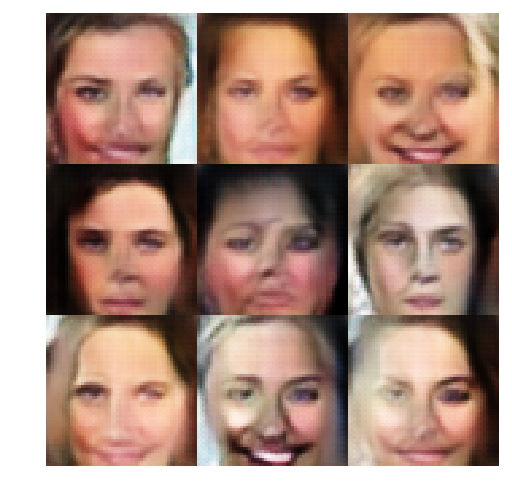

Epoch 3/10 Step 7610... Discriminator Loss: 1.0471... Generator Loss: 1.5272
Epoch 3/10 Step 7620... Discriminator Loss: 1.3161... Generator Loss: 2.1065
Epoch 3/10 Step 7630... Discriminator Loss: 1.0701... Generator Loss: 1.3198
Epoch 3/10 Step 7640... Discriminator Loss: 1.0582... Generator Loss: 1.1640
Epoch 3/10 Step 7650... Discriminator Loss: 1.0215... Generator Loss: 1.2674
Epoch 3/10 Step 7660... Discriminator Loss: 1.1685... Generator Loss: 0.8318
Epoch 3/10 Step 7670... Discriminator Loss: 1.0098... Generator Loss: 1.1512
Epoch 3/10 Step 7680... Discriminator Loss: 0.9993... Generator Loss: 1.1505
Epoch 3/10 Step 7690... Discriminator Loss: 1.0036... Generator Loss: 1.2876
Epoch 3/10 Step 7700... Discriminator Loss: 1.0359... Generator Loss: 1.0414


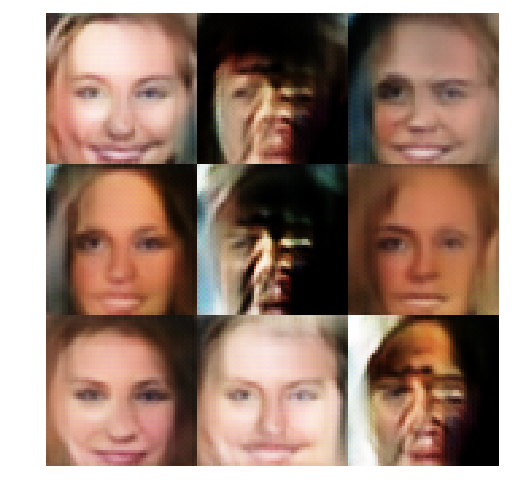

Epoch 3/10 Step 7710... Discriminator Loss: 1.2093... Generator Loss: 1.4686
Epoch 3/10 Step 7720... Discriminator Loss: 0.9834... Generator Loss: 1.2226
Epoch 3/10 Step 7730... Discriminator Loss: 1.0594... Generator Loss: 0.9237
Epoch 3/10 Step 7740... Discriminator Loss: 1.0637... Generator Loss: 1.2235
Epoch 3/10 Step 7750... Discriminator Loss: 1.0750... Generator Loss: 1.4235
Epoch 3/10 Step 7760... Discriminator Loss: 1.0512... Generator Loss: 1.0798
Epoch 3/10 Step 7770... Discriminator Loss: 1.0184... Generator Loss: 1.3710
Epoch 3/10 Step 7780... Discriminator Loss: 1.0641... Generator Loss: 1.5860
Epoch 3/10 Step 7790... Discriminator Loss: 1.0177... Generator Loss: 1.0154
Epoch 3/10 Step 7800... Discriminator Loss: 0.9718... Generator Loss: 1.2586


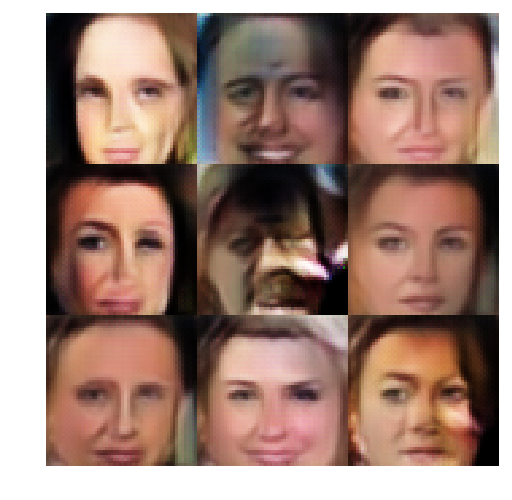

Epoch 3/10 Step 7810... Discriminator Loss: 1.0491... Generator Loss: 0.8947
Epoch 3/10 Step 7820... Discriminator Loss: 1.5440... Generator Loss: 0.5719
Epoch 3/10 Step 7830... Discriminator Loss: 1.0814... Generator Loss: 1.0985
Epoch 3/10 Step 7840... Discriminator Loss: 1.0786... Generator Loss: 0.9138
Epoch 3/10 Step 7850... Discriminator Loss: 1.0266... Generator Loss: 1.1393
Epoch 3/10 Step 7860... Discriminator Loss: 0.9555... Generator Loss: 1.5550
Epoch 3/10 Step 7870... Discriminator Loss: 1.0131... Generator Loss: 1.0671
Epoch 3/10 Step 7880... Discriminator Loss: 1.0408... Generator Loss: 1.1210
Epoch 3/10 Step 7890... Discriminator Loss: 1.0467... Generator Loss: 1.3246
Epoch 3/10 Step 7900... Discriminator Loss: 0.9257... Generator Loss: 1.3961


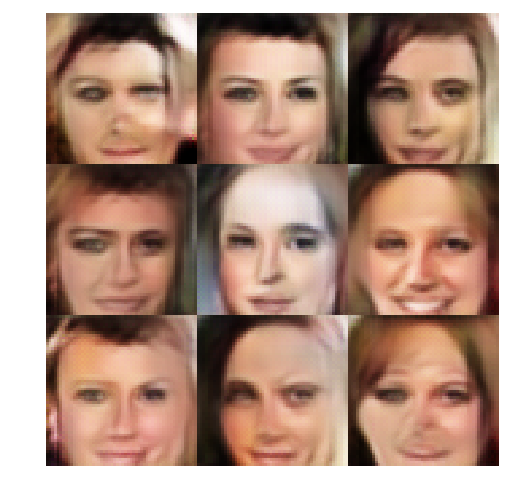

Epoch 3/10 Step 7910... Discriminator Loss: 1.0744... Generator Loss: 1.5041
Epoch 3/10 Step 7920... Discriminator Loss: 1.0861... Generator Loss: 0.8764
Epoch 3/10 Step 7930... Discriminator Loss: 0.9991... Generator Loss: 1.1243
Epoch 3/10 Step 7940... Discriminator Loss: 1.0201... Generator Loss: 1.1043
Epoch 3/10 Step 7950... Discriminator Loss: 1.0385... Generator Loss: 1.4096
Epoch 3/10 Step 7960... Discriminator Loss: 1.0620... Generator Loss: 1.4917
Epoch 3/10 Step 7970... Discriminator Loss: 1.0842... Generator Loss: 1.1029
Epoch 3/10 Step 7980... Discriminator Loss: 1.0198... Generator Loss: 1.3242
Epoch 3/10 Step 7990... Discriminator Loss: 1.0101... Generator Loss: 1.3052
Epoch 3/10 Step 8000... Discriminator Loss: 1.0393... Generator Loss: 1.0428


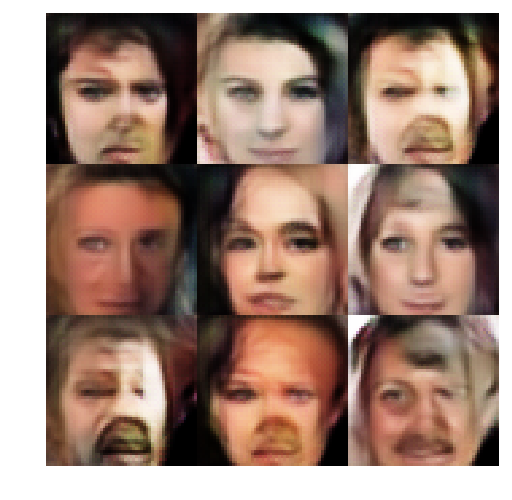

Epoch 3/10 Step 8010... Discriminator Loss: 0.9653... Generator Loss: 1.5836
Epoch 3/10 Step 8020... Discriminator Loss: 1.0566... Generator Loss: 1.0913
Epoch 3/10 Step 8030... Discriminator Loss: 0.9581... Generator Loss: 1.1907
Epoch 3/10 Step 8040... Discriminator Loss: 1.0291... Generator Loss: 1.3498
Epoch 3/10 Step 8050... Discriminator Loss: 1.0274... Generator Loss: 1.0617
Epoch 3/10 Step 8060... Discriminator Loss: 1.0424... Generator Loss: 1.4695
Epoch 3/10 Step 8070... Discriminator Loss: 0.9763... Generator Loss: 1.3646
Epoch 3/10 Step 8080... Discriminator Loss: 0.9580... Generator Loss: 1.4401
Epoch 3/10 Step 8090... Discriminator Loss: 0.9639... Generator Loss: 1.2477
Epoch 3/10 Step 8100... Discriminator Loss: 1.0352... Generator Loss: 1.4380


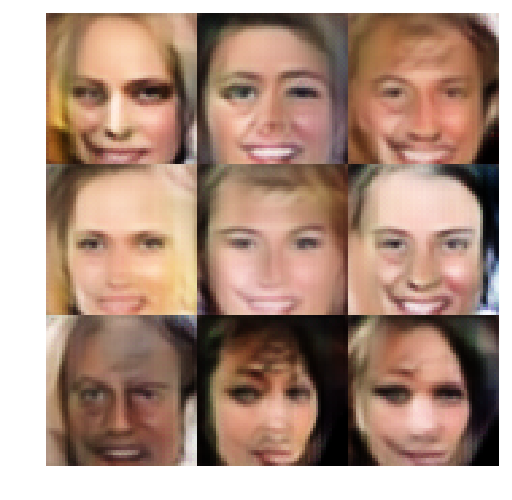

Epoch 3/10 Step 8110... Discriminator Loss: 1.0502... Generator Loss: 1.2323
Epoch 3/10 Step 8120... Discriminator Loss: 1.0099... Generator Loss: 1.3194
Epoch 3/10 Step 8130... Discriminator Loss: 1.0697... Generator Loss: 1.4613
Epoch 3/10 Step 8140... Discriminator Loss: 0.9304... Generator Loss: 1.2443
Epoch 3/10 Step 8150... Discriminator Loss: 1.0673... Generator Loss: 1.3051
Epoch 3/10 Step 8160... Discriminator Loss: 1.1079... Generator Loss: 1.1416
Epoch 3/10 Step 8170... Discriminator Loss: 1.0283... Generator Loss: 1.1080
Epoch 3/10 Step 8180... Discriminator Loss: 1.1278... Generator Loss: 1.0185
Epoch 3/10 Step 8190... Discriminator Loss: 1.0245... Generator Loss: 1.4822
Epoch 3/10 Step 8200... Discriminator Loss: 1.0425... Generator Loss: 1.0351


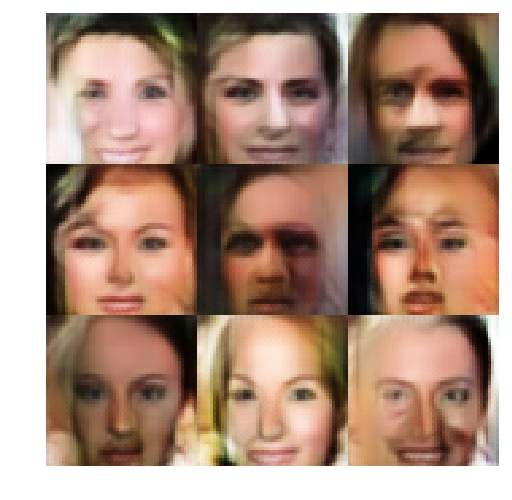

Epoch 3/10 Step 8210... Discriminator Loss: 1.3011... Generator Loss: 0.7677
Epoch 3/10 Step 8220... Discriminator Loss: 1.0507... Generator Loss: 1.2101
Epoch 3/10 Step 8230... Discriminator Loss: 1.1518... Generator Loss: 0.7433
Epoch 3/10 Step 8240... Discriminator Loss: 1.0584... Generator Loss: 1.0764
Epoch 3/10 Step 8250... Discriminator Loss: 0.9786... Generator Loss: 1.4270
Epoch 3/10 Step 8260... Discriminator Loss: 1.0547... Generator Loss: 1.1954
Epoch 3/10 Step 8270... Discriminator Loss: 1.3442... Generator Loss: 0.7716
Epoch 3/10 Step 8280... Discriminator Loss: 1.0461... Generator Loss: 1.3786
Epoch 3/10 Step 8290... Discriminator Loss: 1.1500... Generator Loss: 0.9289
Epoch 3/10 Step 8300... Discriminator Loss: 1.0828... Generator Loss: 1.0856


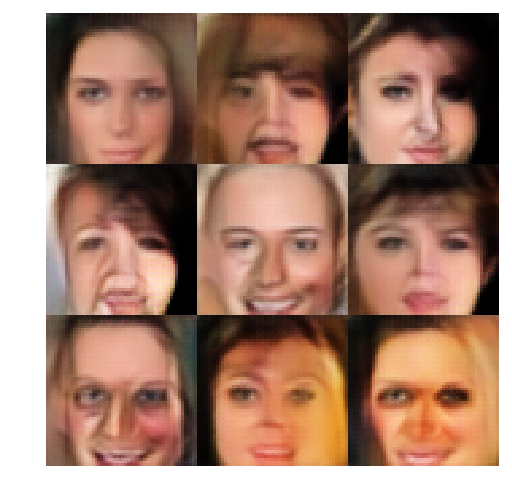

Epoch 3/10 Step 8310... Discriminator Loss: 1.0219... Generator Loss: 1.2444
Epoch 3/10 Step 8320... Discriminator Loss: 1.0484... Generator Loss: 1.6342
Epoch 3/10 Step 8330... Discriminator Loss: 1.0184... Generator Loss: 1.2025
Epoch 3/10 Step 8340... Discriminator Loss: 1.0118... Generator Loss: 1.1489
Epoch 3/10 Step 8350... Discriminator Loss: 1.0482... Generator Loss: 1.0545
Epoch 3/10 Step 8360... Discriminator Loss: 1.4461... Generator Loss: 2.1849
Epoch 3/10 Step 8370... Discriminator Loss: 0.9587... Generator Loss: 1.4469
Epoch 3/10 Step 8380... Discriminator Loss: 1.4990... Generator Loss: 1.9346
Epoch 3/10 Step 8390... Discriminator Loss: 1.0769... Generator Loss: 1.0806
Epoch 3/10 Step 8400... Discriminator Loss: 1.0942... Generator Loss: 1.4349


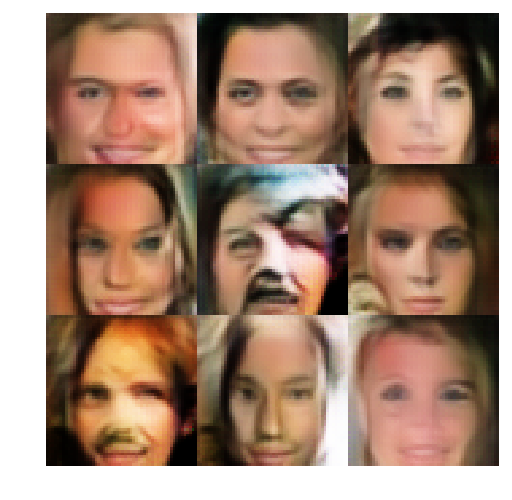

Epoch 3/10 Step 8410... Discriminator Loss: 1.0405... Generator Loss: 1.2399
Epoch 3/10 Step 8420... Discriminator Loss: 0.9973... Generator Loss: 1.1307
Epoch 3/10 Step 8430... Discriminator Loss: 0.9321... Generator Loss: 1.6030
Epoch 3/10 Step 8440... Discriminator Loss: 1.2248... Generator Loss: 0.8391
Epoch 3/10 Step 8450... Discriminator Loss: 0.9642... Generator Loss: 1.2847
Epoch 3/10 Step 8460... Discriminator Loss: 0.9776... Generator Loss: 1.1970
Epoch 3/10 Step 8470... Discriminator Loss: 0.9928... Generator Loss: 1.3187
Epoch 3/10 Step 8480... Discriminator Loss: 1.0335... Generator Loss: 1.0710
Epoch 3/10 Step 8490... Discriminator Loss: 1.0257... Generator Loss: 1.7866
Epoch 3/10 Step 8500... Discriminator Loss: 0.9957... Generator Loss: 1.2988


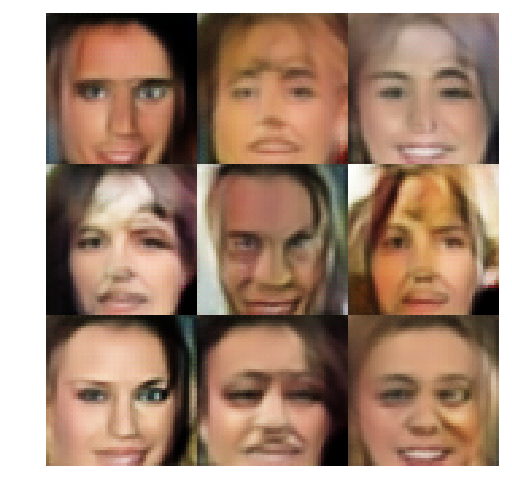

Epoch 3/10 Step 8510... Discriminator Loss: 1.0693... Generator Loss: 1.3704
Epoch 3/10 Step 8520... Discriminator Loss: 1.0549... Generator Loss: 0.9134
Epoch 3/10 Step 8530... Discriminator Loss: 0.9764... Generator Loss: 1.3739
Epoch 3/10 Step 8540... Discriminator Loss: 1.2711... Generator Loss: 0.6430
Epoch 3/10 Step 8550... Discriminator Loss: 0.9797... Generator Loss: 1.3652
Epoch 3/10 Step 8560... Discriminator Loss: 1.0518... Generator Loss: 1.1456
Epoch 3/10 Step 8570... Discriminator Loss: 1.0215... Generator Loss: 1.1122
Epoch 3/10 Step 8580... Discriminator Loss: 1.0050... Generator Loss: 1.1778
Epoch 3/10 Step 8590... Discriminator Loss: 1.0266... Generator Loss: 1.2032
Epoch 3/10 Step 8600... Discriminator Loss: 1.1565... Generator Loss: 1.6761


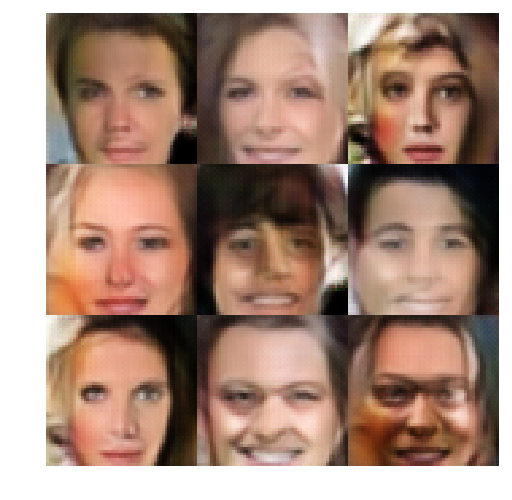

Epoch 3/10 Step 8610... Discriminator Loss: 1.1028... Generator Loss: 1.0621
Epoch 3/10 Step 8620... Discriminator Loss: 1.1320... Generator Loss: 0.8970
Epoch 3/10 Step 8630... Discriminator Loss: 1.0078... Generator Loss: 1.5698
Epoch 3/10 Step 8640... Discriminator Loss: 1.1159... Generator Loss: 1.6724
Epoch 3/10 Step 8650... Discriminator Loss: 1.0032... Generator Loss: 1.1645
Epoch 3/10 Step 8660... Discriminator Loss: 0.9771... Generator Loss: 1.1790
Epoch 3/10 Step 8670... Discriminator Loss: 1.0779... Generator Loss: 1.2822
Epoch 3/10 Step 8680... Discriminator Loss: 1.0450... Generator Loss: 1.2840
Epoch 3/10 Step 8690... Discriminator Loss: 0.9975... Generator Loss: 1.0970
Epoch 3/10 Step 8700... Discriminator Loss: 1.1550... Generator Loss: 0.8355


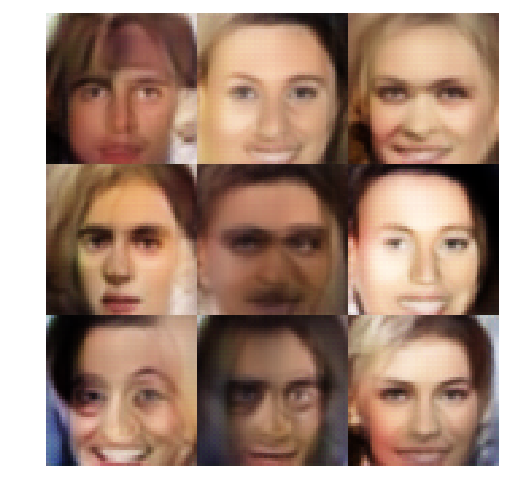

Epoch 3/10 Step 8710... Discriminator Loss: 1.1873... Generator Loss: 0.8596
Epoch 3/10 Step 8720... Discriminator Loss: 0.9477... Generator Loss: 1.2561
Epoch 3/10 Step 8730... Discriminator Loss: 1.0567... Generator Loss: 1.3515
Epoch 3/10 Step 8740... Discriminator Loss: 1.0318... Generator Loss: 1.2975
Epoch 3/10 Step 8750... Discriminator Loss: 1.0147... Generator Loss: 1.1805
Epoch 3/10 Step 8760... Discriminator Loss: 1.0214... Generator Loss: 0.9904
Epoch 3/10 Step 8770... Discriminator Loss: 1.0573... Generator Loss: 1.1310
Epoch 3/10 Step 8780... Discriminator Loss: 1.0287... Generator Loss: 1.1819
Epoch 3/10 Step 8790... Discriminator Loss: 1.0610... Generator Loss: 1.5944
Epoch 3/10 Step 8800... Discriminator Loss: 1.3216... Generator Loss: 0.7540


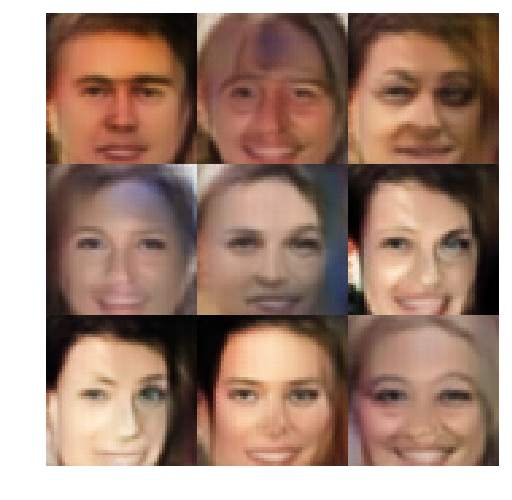

Epoch 3/10 Step 8810... Discriminator Loss: 1.0415... Generator Loss: 1.1559
Epoch 3/10 Step 8820... Discriminator Loss: 1.0294... Generator Loss: 1.4168
Epoch 3/10 Step 8830... Discriminator Loss: 1.0283... Generator Loss: 1.4809
Epoch 3/10 Step 8840... Discriminator Loss: 1.1419... Generator Loss: 1.6637
Epoch 3/10 Step 8850... Discriminator Loss: 1.0496... Generator Loss: 1.2925
Epoch 3/10 Step 8860... Discriminator Loss: 1.0100... Generator Loss: 0.9805
Epoch 3/10 Step 8870... Discriminator Loss: 1.1292... Generator Loss: 0.9421
Epoch 3/10 Step 8880... Discriminator Loss: 0.9255... Generator Loss: 1.2501
Epoch 3/10 Step 8890... Discriminator Loss: 1.3916... Generator Loss: 0.7292
Epoch 3/10 Step 8900... Discriminator Loss: 1.1105... Generator Loss: 1.1488


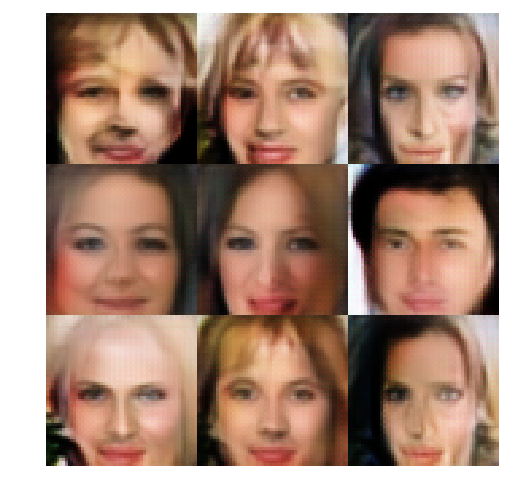

Epoch 3/10 Step 8910... Discriminator Loss: 1.0663... Generator Loss: 1.2960
Epoch 3/10 Step 8920... Discriminator Loss: 1.5240... Generator Loss: 0.6627
Epoch 3/10 Step 8930... Discriminator Loss: 1.0353... Generator Loss: 1.1205
Epoch 3/10 Step 8940... Discriminator Loss: 0.9783... Generator Loss: 1.1830
Epoch 3/10 Step 8950... Discriminator Loss: 1.0512... Generator Loss: 1.0823
Epoch 3/10 Step 8960... Discriminator Loss: 1.0184... Generator Loss: 1.4591
Epoch 3/10 Step 8970... Discriminator Loss: 0.9877... Generator Loss: 1.3881
Epoch 3/10 Step 8980... Discriminator Loss: 1.1125... Generator Loss: 1.1543
Epoch 3/10 Step 8990... Discriminator Loss: 1.0291... Generator Loss: 1.5060
Epoch 3/10 Step 9000... Discriminator Loss: 1.0784... Generator Loss: 1.0481


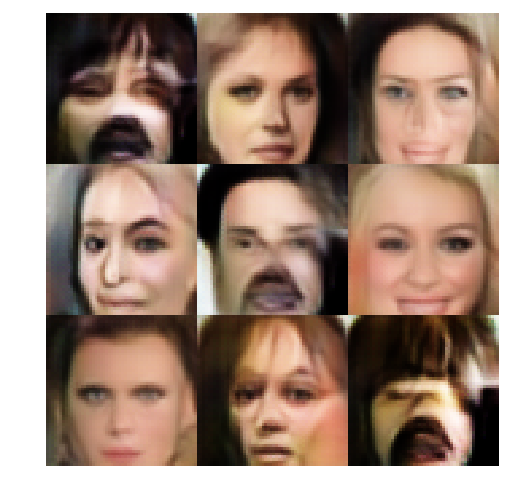

Epoch 3/10 Step 9010... Discriminator Loss: 1.1521... Generator Loss: 1.9228
Epoch 3/10 Step 9020... Discriminator Loss: 0.9987... Generator Loss: 1.4775
Epoch 3/10 Step 9030... Discriminator Loss: 0.9850... Generator Loss: 1.3631
Epoch 3/10 Step 9040... Discriminator Loss: 1.0700... Generator Loss: 1.3802
Epoch 3/10 Step 9050... Discriminator Loss: 2.7584... Generator Loss: 0.2349
Epoch 3/10 Step 9060... Discriminator Loss: 1.2374... Generator Loss: 0.7484
Epoch 3/10 Step 9070... Discriminator Loss: 1.1116... Generator Loss: 1.3620


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.45


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

In [ ]:
import cv2
for f in glob.glob("output/**/*.png"):
    image = cv2.imread(f)
    # cv2.imshow('my_image', image)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
    large = cv2.resize(image, (0,0), fx=3, fy=3)
    cv2.imwrite(f, large)
